# **Lightweight Machine Learning for Detecting DGA-Based  Botnet Communications (Balanced)**

Imports

In [17]:
from collections import Counter
from datetime import datetime
from dateutil import parser
from itertools import combinations
import kagglehub
import matplotlib.pyplot as plt
import math
import pandas as pd
import re
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import plot_tree
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, roc_curve, auc, confusion_matrix
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score

Download Benign Domains

In [18]:
cisco_path = kagglehub.dataset_download("adebayo/cisco-umbrella-list")
cisco_path += "/top-1m.csv"
print(cisco_path)

C:\Users\Admin\.cache\kagglehub\datasets\adebayo\cisco-umbrella-list\versions\1/top-1m.csv


Download Malicious DGA Domains

In [19]:
dga_path = kagglehub.dataset_download("gtkcyber/dga-dataset")
dga_path += "/dga_data.csv"
print(dga_path)

C:\Users\Admin\.cache\kagglehub\datasets\gtkcyber\dga-dataset\versions\1/dga_data.csv


Load Datasets

In [20]:
benign_domains = pd.read_csv(cisco_path, header=None)
benign_domains.columns = ["rank", "domain"]
benign_domains["label"] = 0

dga_domains = pd.read_csv(dga_path)
dga_domains["label"] = dga_domains["subclass"].apply(lambda x: 0 if x in ["alexa", "legit"] else 1)
# remove fake DGAs
dga_domains = dga_domains[dga_domains["label"] == 1]

print("Length of Benign Domain dataset:", len(benign_domains))
print("Length of DGA Domain dataset:", len(dga_domains))

benign_sample = benign_domains[["domain", "label"]]
dga_sample = dga_domains[["domain", "label"]]
benign_sampler = benign_domains[["domain", "label"]].sample(n=len(dga_sample), random_state=60)
df_full = pd.concat([benign_sample, dga_sample], ignore_index=True)
df = pd.concat([benign_sampler, dga_sample], ignore_index=True)
# Drop any rows with missing domains
print("Missing domains (benign):", benign_sample["domain"].isna().sum())
print("Missing domains (DGA):   ", dga_sample["domain"].isna().sum())
df = df.dropna(subset=["domain"]).reset_index(drop=True)
df["domain"] = df["domain"].astype(str).str.lower()
df_full = df_full.dropna(subset=["domain"]).reset_index(drop=True)
df_full["domain"] = df_full["domain"].astype(str).str.lower()

print("\nClass balance:")
print(df["label"].value_counts())
print(df["label"].value_counts(normalize=True).round(3))

Length of Benign Domain dataset: 1000000
Length of DGA Domain dataset: 80000
Missing domains (benign): 0
Missing domains (DGA):    0

Class balance:
label
0    80000
1    80000
Name: count, dtype: int64
label
0    0.5
1    0.5
Name: proportion, dtype: float64


In [21]:
print(dga_domains.columns.tolist())
print(dga_domains.head(10))

['isDGA', 'domain', 'host', 'subclass', 'label']
  isDGA                      domain                            host  \
0   dga  6xzxsw3sokvg1tc752y1a6p0af  6xzxsw3sokvg1tc752y1a6p0af.com   
1   dga              glbtlxwwhbnpxs               glbtlxwwhbnpxs.ru   
2   dga              xxmamopyipbfpk               xxmamopyipbfpk.ru   
3   dga   zfd5szpi18i85wj9uy13l69rg   zfd5szpi18i85wj9uy13l69rg.net   
4   dga                jpqftymiuver                 jpqftymiuver.ru   
5   dga                   takenroll                   takenroll.net   
6   dga                vrrtneoswsds                 vrrtneoswsds.ru   
7   dga   mzapiwbcsbqiyxnlxa1hprx8n   mzapiwbcsbqiyxnlxa1hprx8n.com   
8   dga              xkoihiygtanuio               xkoihiygtanuio.ru   
9   dga                   dreamdont                   dreamdont.net   

       subclass  label  
0   gameoverdga      1  
1  cryptolocker      1  
2  cryptolocker      1  
3        newgoz      1  
4  cryptolocker      1  
5       nivdort    

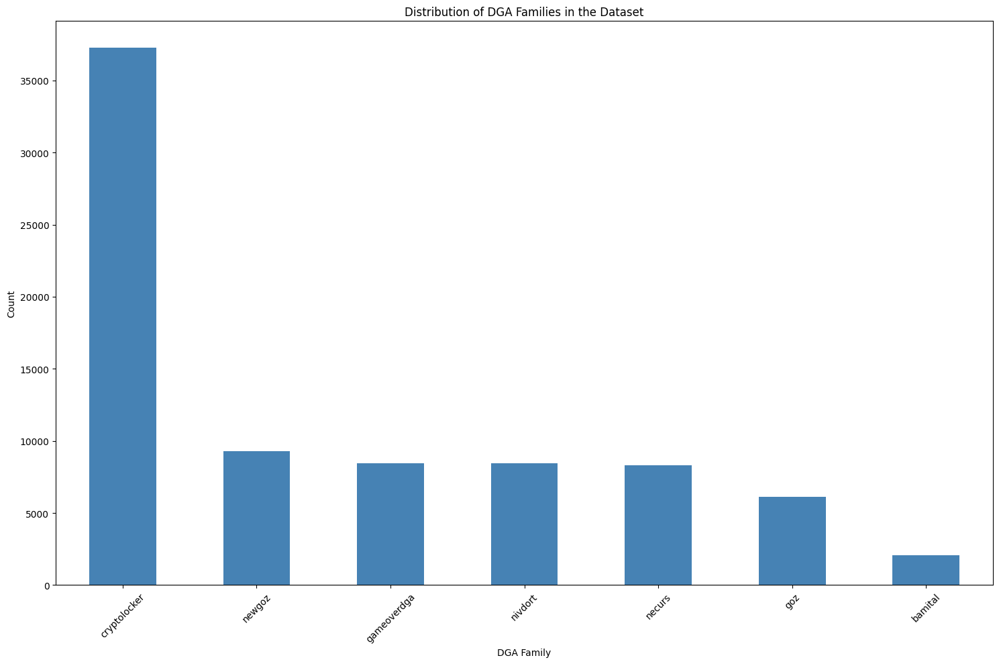


Total DGA families: 7

Appearing families:
subclass
cryptolocker    37254
newgoz           9276
gameoverdga      8461
nivdort          8456
necurs           8331
goz              6136
bamital          2086
Name: count, dtype: int64


In [22]:
family_col = "subclass"

family_counts = dga_domains[family_col].value_counts()

fig, ax = plt.subplots(figsize=(15, 10))
family_counts.plot(kind="bar", ax=ax, color=["steelblue"])
ax.set_xlabel("DGA Family")
ax.set_ylabel("Count")
ax.set_title("Distribution of DGA Families in the Dataset")
ax.tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.show()

print(f"\nTotal DGA families: {family_counts.nunique()}")
print(f"\nAppearing families:\n{family_counts.head(10)}")

In [23]:
print("Sample Domain Names by DGA Family")
for family in dga_domains[family_col].unique():
    examples = dga_domains[dga_domains[family_col] == family]["domain"].head(5).tolist()
    print(f"{family:20s}: {examples}")

Sample Domain Names by DGA Family
gameoverdga         : ['6xzxsw3sokvg1tc752y1a6p0af', '1rw1pc44mkxp4qjx18qua26', '1x75xo41t4fno51wc86e1y4s13d', '1y6oppp7k3pwfpo2sfmkloyxa', '1t5fkef5u26di8wtme9ezjamn']
cryptolocker        : ['glbtlxwwhbnpxs', 'xxmamopyipbfpk', 'jpqftymiuver', 'vrrtneoswsds', 'xkoihiygtanuio']
newgoz              : ['zfd5szpi18i85wj9uy13l69rg', 'mzapiwbcsbqiyxnlxa1hprx8n', 'n3m4txqpb6a415iwzkrmdzgk6', 'wawft814u5se21tmptb51yy47q2', 'by86yc1p7f81d1tb5g7h1el8t9k']
nivdort             : ['takenroll', 'dreamdont', 'visitshot', 'mostjune', 'fairslow']
goz                 : ['rcdqeqmpxgdiuqombhuwcfu', 'jrxrovxkbemgqutopblbbfe', 'dixnzhelzukwsojfxuivlamadu', 'ydhmbyhgypnkdpzcymnnjxcalfm', 'umficyzdvcdpzbalvdmkjjvcm']
necurs              : ['sfmbdpnijlarq', 'vdqqfdcax', 'njtvrfhfaklho', 'hsmcnwof', 'mcedlrfqaqjcypqwhmio']
bamital             : ['5df9d44072820ad6eaac91669f357fea', 'a7fd378e8e64200f13421e6135a06dce', 'dd82f8a0b2b6520e2706f704ba2a289a', '08c9bb43ca6555de477ec262b

In [24]:
rows = []
for family in dga_domains[family_col].value_counts().index:
    examples = dga_domains[dga_domains[family_col] == family]["domain"].head(3).tolist()
    rows.append({
        "Family": family,
        "Count": len(dga_domains[dga_domains[family_col] == family]),
        "Example 1": examples[0] if len(examples) > 0 else "",
        "Example 2": examples[1] if len(examples) > 1 else "",
        "Example 3": examples[2] if len(examples) > 2 else "",
    })
example_table = pd.DataFrame(rows)
print(example_table.to_string(index=False))

      Family  Count                        Example 1                        Example 2                        Example 3
cryptolocker  37254                   glbtlxwwhbnpxs                   xxmamopyipbfpk                     jpqftymiuver
      newgoz   9276        zfd5szpi18i85wj9uy13l69rg        mzapiwbcsbqiyxnlxa1hprx8n        n3m4txqpb6a415iwzkrmdzgk6
 gameoverdga   8461       6xzxsw3sokvg1tc752y1a6p0af          1rw1pc44mkxp4qjx18qua26      1x75xo41t4fno51wc86e1y4s13d
     nivdort   8456                        takenroll                        dreamdont                        visitshot
      necurs   8331                    sfmbdpnijlarq                        vdqqfdcax                    njtvrfhfaklho
         goz   6136          rcdqeqmpxgdiuqombhuwcfu          jrxrovxkbemgqutopblbbfe       dixnzhelzukwsojfxuivlamadu
     bamital   2086 5df9d44072820ad6eaac91669f357fea a7fd378e8e64200f13421e6135a06dce dd82f8a0b2b6520e2706f704ba2a289a


Skipping bamital: not enough variation


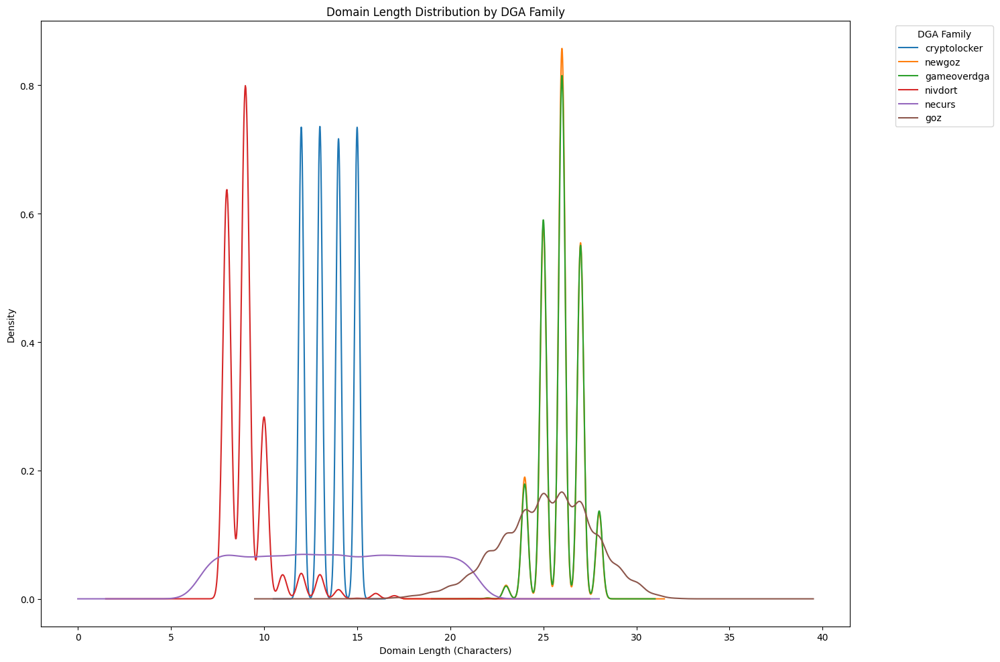

In [25]:
top_families = dga_domains[family_col].value_counts().head(10).index
dgas = dga_domains.copy()
dgas["length"] = dgas["domain"].str.split(".").str[0].str.len()

fig, ax = plt.subplots(figsize=(15, 10))
for family in top_families:
    subset = dgas[dgas[family_col] == family]["length"].dropna()
    if(subset.nunique() < 2):
        print(f"Skipping {family}: not enough variation")
        continue
    subset.plot(kind="kde", ax=ax, label=family)

ax.set_xlabel("Domain Length (Characters)")
ax.set_ylabel("Density")
ax.set_title("Domain Length Distribution by DGA Family")
ax.legend(title="DGA Family", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

Extract Features

In [26]:
def shannon_entropy(s):
    """Measures randomness of characters in a string. Higher = more random."""
    if not s:
        return 0.0
    counts = Counter(s)
    length = len(s)
    return -sum((c/length) * math.log2(c/length) for c in counts.values())

def vowel_ratio(s):
    if not s:
        return 0.0
    vowels = sum(1 for ch in s if ch in "aeiou")
    letters = sum(1 for ch in s if ch.isalpha())
    return vowels / letters if letters else 0.0

def digit_ratio(s):
    if not s:
        return 0.0
    return sum(1 for ch in s if ch.isdigit()) / len(s)

def max_consecutive_consonants(s):
    rows = re.findall(r'[^aeiou\d\W_]+', s)
    maximum = max((len(r) for r in rows), default=0)
    return maximum

def hex_valid_ratio(s):
    if(not s):
        return 0
    return sum(1 for ch in s if ch in '0123456789abcdef') / len(s)

def is_dword_value(s):
    return int(bool(re.fullmatch(r'[0-9a-f]{8}', s)))

def max_consecutive_digits(s):
    rows = re.findall(r'\d+', s)
    maximum = max((len(r) for r in rows), default=0)
    return maximum

def is_punycode(domain):
    return int(any(label.startswith('xn--') for label in domain.split('.')))

def subdomain_count(domain):
    return len(domain.split('.')) - 1

# top-level domain
def tld_detection(df):
    tlds = df.groupby("tld")["label"]
    tld_counts = tlds.count()
    tld_sums = tlds.sum()
    # Laplace Smoothing - Benign and DGA (2)
    tld_malicious_laplace_smoothed = (tld_sums + 1) / (tld_counts + 2)
    return tld_malicious_laplace_smoothed
    # return df["tld"].map(tld_malicious_laplace_smoothed)

def has_embedded_date(s):
    no_date = datetime(1900, 1, 1)
    try:
        result = parser.parse(s, fuzzy=True, default=no_date)
        if(result.date() == no_date.date()):
            return 0
        return 1
    except (ValueError, parser.ParserError, OverflowError):
        return 0
    
def cons_vowel_transition_rate(s):
    def is_vowel(character):
        return (character in 'aeiou')
    
    # we want to ignore digits and hyphens
    alpha = [ch for ch in s if ch.isalpha()] 
    if(len(alpha) < 2):
        return 0.0
    curr_v = is_vowel(alpha[0])
    trans_count = 0
    if(curr_v):
        vowel_count = 1
    else:
        vowel_count = 0

    for ch in alpha[1:]:
        typing = is_vowel(ch)
        if(typing):
            vowel_count += 1
        # if a change in vowel to consonant or vice-versa, it is a transition
        if(typing != curr_v):
            trans_count += 1
            curr_v = typing

    if(vowel_count < 2):
        return 0.0
    return trans_count / (vowel_count - 1)

def char_class_entropy(s):
    def classify(ch):
        # if a vowel
        if(ch in 'aeiou'):
            return 'V'
        # otherwise if a letter, it is a consonant
        elif(ch.isalpha()):
            return 'C'
        # if it is a number
        elif(ch.isdigit()):
            return 'D'
        # if it is a special character, like a hyphen
        else:
            return 'H'
    classes = ''.join(classify(ch) for ch in s)
    return shannon_entropy(classes)

df["name"] = df["domain"].str.split(".").str[0]
df["tld"] = df["domain"].str.split(".").str[-1]
df_full["tld"] = df_full["domain"].str.split(".").str[-1]
df["length"] = df["name"].str.len()
df["entropy"] = df["name"].apply(shannon_entropy)
df["vowel_ratio"] = df["name"].apply(vowel_ratio)
df["digit_ratio"] = df["name"].apply(digit_ratio)
df["unique_chars"] = df["name"].apply(lambda s: len(set(s)))
df["hyphen_count"] = df["name"].str.count('-')
df["max_consec_cons"] = df["name"].apply(max_consecutive_consonants)
df["hex_ratio"] = df["name"].apply(hex_valid_ratio)
df["dword"] = df["name"].apply(is_dword_value)
df["max_consec_digit"] = df["name"].apply(max_consecutive_digits)
df["puny_code"] = df["domain"].apply(is_punycode)
df["subdomain_count"] = df["domain"].apply(subdomain_count)
tld_rates = tld_detection(df_full)
df["mal_tld"] = df["tld"].map(tld_rates).fillna(0.35)
df["embed_date"] = df["name"].apply(has_embedded_date)
df["cons_vowel_transition_rate"] = df["name"].apply(cons_vowel_transition_rate)
df["char_class_entropy"] = df["name"].apply(char_class_entropy)


In [27]:
print("\n--- Feature statistics by class ---")
summary = df.groupby("label")[["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "subdomain_count", "mal_tld", "embed_date", "cons_vowel_transition_rate", "char_class_entropy"]].agg(["mean", "std", "median"])
print(summary.round(3))

print("\n--- Random samples ---")
print("Benign:", df[df.label == 0]["domain"].sample(5, random_state=1).tolist())
print("DGA:   ", df[df.label == 1]["domain"].sample(5, random_state=1).tolist())


--- Feature statistics by class ---
       length               entropy               vowel_ratio                \
         mean    std median    mean    std median        mean    std median   
label                                                                         
0       8.607  6.504    7.0   2.314  1.011  2.522       0.273  0.218  0.308   
1      17.213  6.730   14.0   3.460  0.444  3.418       0.217  0.116  0.211   

      digit_ratio  ... mal_tld embed_date                \
             mean  ...  median       mean    std median   
label              ...                                    
0           0.153  ...   0.000      0.152  0.359    0.0   
1           0.089  ...   0.667      0.064  0.245    0.0   

      cons_vowel_transition_rate               char_class_entropy         \
                            mean    std median               mean    std   
label                                                                      
0                          1.374  1.370    

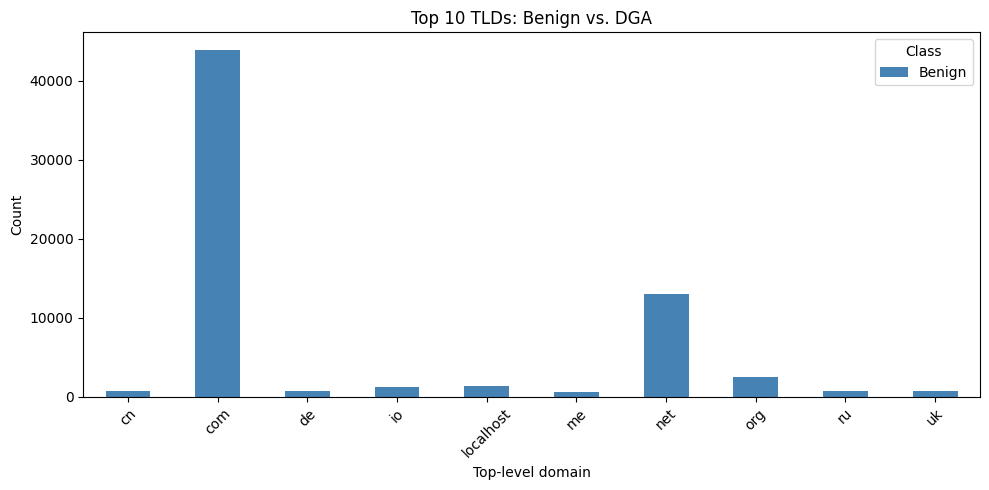

In [28]:
top_tlds = df["tld"].value_counts().head(10).index

# tld_by_class = df[df.tld.isin(top_tlds)].groupby(["tld", "label"]).size().unstack(fill_value=0)
# tld_by_class.columns = ["Benign", "DGA"]
# tld_by_class = tld_by_class.loc[top_tlds]

tld_by_class = (df[df.tld.isin(top_tlds)].groupby(["tld", "label"]).size().unstack(fill_value=0))

tld_by_class = tld_by_class.rename(
    columns={0: "Benign", 1: "DGA"}
)

fig, ax = plt.subplots(figsize=(10, 5))
tld_by_class.plot(kind="bar", ax=ax, color=["steelblue", "crimson"])
ax.set_xlabel("Top-level domain")
ax.set_ylabel("Count")
ax.set_title("Top 10 TLDs: Benign vs. DGA")
ax.legend(title="Class")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [29]:
# Build a clean comparison table: Benign vs DGA side-by-side
features = ["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "subdomain_count", "mal_tld", "embed_date", "cons_vowel_transition_rate", "char_class_entropy"]

stats = df.groupby("label")[features].agg(["mean", "std", "median"])

# Reshape so features are rows and (class, stat) are columns
benign_stats = stats.loc[0].unstack(level=0)  # rows = stat, cols = feature
dga_stats    = stats.loc[1].unstack(level=0)

# Build a tidy summary dataframe
summary = pd.DataFrame({
    "Benign (mean)":   [df[df.label == 0][f].mean()   for f in features],
    "Benign (median)": [df[df.label == 0][f].median() for f in features],
    "Benign (std)":    [df[df.label == 0][f].std()    for f in features],
    "DGA (mean)":      [df[df.label == 1][f].mean()   for f in features],
    "DGA (median)":    [df[df.label == 1][f].median() for f in features],
    "DGA (std)":       [df[df.label == 1][f].std()    for f in features],
}, index=features)

# Add a difference column to highlight which features separate the classes
summary["Δ mean (DGA − Benign)"] = summary["DGA (mean)"] - summary["Benign (mean)"]

summary = summary.round(3)
print(summary.to_string())

                            Benign (mean)  Benign (median)  Benign (std)  DGA (mean)  DGA (median)  DGA (std)  Δ mean (DGA − Benign)
length                              8.607            7.000         6.504      17.213        14.000      6.730                  8.607
entropy                             2.314            2.522         1.011       3.460         3.418      0.444                  1.146
vowel_ratio                         0.273            0.308         0.218       0.217         0.211      0.116                 -0.056
digit_ratio                         0.153            0.000         0.261       0.089         0.000      0.168                 -0.064
unique_chars                        6.501            6.000         3.946      12.487        11.000      3.957                  5.986
hyphen_count                        0.513            0.000         1.152       0.000         0.000      0.000                 -0.513
max_consec_cons                     2.229            2.000         1.

In [30]:
# Styled version for notebook display
styled = (summary.style
    .background_gradient(subset=["Δ mean (DGA − Benign)"], cmap="RdBu_r")
    .format("{:.3f}")
    .set_caption("Feature Statistics by Class (0 = Benign, 1 = DGA)")
    .set_table_styles([
        {"selector": "caption", "props": [("font-size", "14px"), ("font-weight", "bold"), ("padding", "8px")]},
        {"selector": "th", "props": [("text-align", "center"), ("padding", "6px")]},
        {"selector": "td", "props": [("text-align", "right"), ("padding", "6px")]},
    ])
)
styled

,Benign (mean),Benign (median),Benign (std),DGA (mean),DGA (median),DGA (std),Δ mean (DGA − Benign)
length,8.607,7.000,6.504,17.213,14.000,6.730,8.607
entropy,2.314,2.522,1.011,3.460,3.418,0.444,1.146
vowel_ratio,0.273,0.308,0.218,0.217,0.211,0.116,-0.056
digit_ratio,0.153,0.000,0.261,0.089,0.000,0.168,-0.064
unique_chars,6.501,6.000,3.946,12.487,11.000,3.957,5.986
hyphen_count,0.513,0.000,1.152,0.000,0.000,0.000,-0.513
max_consec_cons,2.229,2.000,1.231,6.031,5.000,3.242,3.802
hex_ratio,0.382,0.333,0.255,0.319,0.286,0.188,-0.063
dword,0.002,0.000,0.045,0.000,0.000,0.004,-0.002
max_consec_digit,0.988,0.000,1.961,0.727,0.000,1.515,-0.262


In [31]:
def roc_auc_fpr(best_n_acc, best_n_prec, best_n_recall, best_n_f1, X_train, y_train, X_test, y_test):
    # complete ROC-AUC (theoretical capability measure of detecting DGAs) and False Positive Rate (practical deployability)
    fig, ax = plt.subplots(figsize=(8, 6))

    # plot a curve for each metric's best model
    for best_n, label, color in [
        (best_n_acc, "Accuracy", "blue"),
        (best_n_prec, "Precision", "green"),
        (best_n_recall, "Recall", "orange"),
        (best_n_f1, "F1 Score", "red")]:
        clf = RandomForestClassifier(n_estimators=best_n, random_state=60)
        clf.fit(X_train, y_train)
        # probability of a DGA class
        y_prob = clf.predict_proba(X_test)[:, 1]  
        y_pred = clf.predict(X_test)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        # number of benign domains incorrectly flagged as DGA
        fpr0 = fp / (fp + tn)   
        # how many DGA domains were overlooked
        fnr = fn / (fn + tp)
        
        print(f"{label} (n={best_n}):")
        print(f"\tFalse Positive Rate: {fpr0:.5f} ({fpr0*100:.3f}%)")
        print(f"\tFalse Negative Rate: {fnr:.5f} ({fnr*100:.3f}%)")
        print(f"\tTrue Negatives={tn}, False Positives={fp}, False Negatives={fn}, True Positives={tp}\n")
        # fpr = false positive rates, tpr = true positive rates
        fpr, tpr, thresholds = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=color, label=f"{label} (AUC = {roc_auc:.3f})")

    # draw a line for the random classifier baseline
    ax.plot([0, 1], [0, 1], 'k--', label="Random Classifier (AUC = 0.50)")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_title("ROC-AUC Curve")
    ax.legend()
    ax.grid(True)
    plt.tight_layout()
    plt.show()



Logistic Regression's Accuracy:  0.99990625
Logistic Regression's Precision: 0.9998128041931861
Logistic Regression's Recall:    1.0
Logistic Regression's F1 Score:  0.9999063933352055
Training: 1
Training: 2
Training: 3
Training: 4
Training: 5
Training: 6
Training: 7
Training: 8
Training: 9
Training: 10
Training: 11
Training: 12
Training: 13
Training: 14
Training: 15
Training: 16
Training: 17
Training: 18
Training: 19
Training: 20
Training: 21
Training: 22
Training: 23
Training: 24
Training: 25
Training: 26
Training: 27
Training: 28
Training: 29
Training: 30
Training: 31
Training: 32
Training: 33
Training: 34
Training: 35
Training: 36
Training: 37
Training: 38
Training: 39
Training: 40
Training: 41
Training: 42
Training: 43
Training: 44
Training: 45
Training: 46
Training: 47
Training: 48
Training: 49
Training: 50
Training: 51
Training: 52
Training: 53
Training: 54
Training: 55
Training: 56
Training: 57
Training: 58
Training: 59
Training: 60
Training: 61
Training: 62
Training: 63
Train

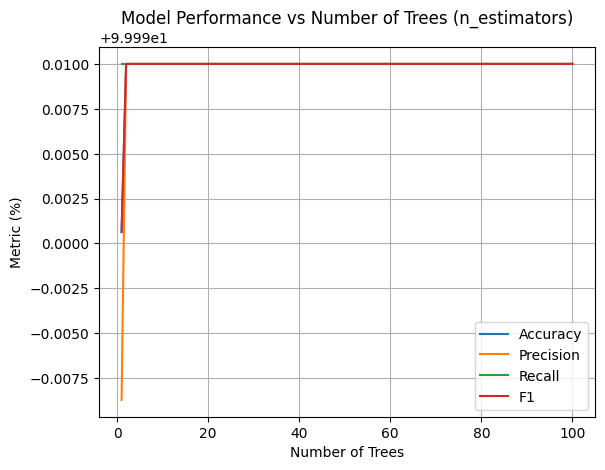

Best n_estimators (Accuracy): 2
Best Accuracy: 1.0
Best n_estimators (Precision): 2
Best Precision: 1.0
Best n_estimators (Recall): 1
Best Recall: 1.0
Best n_estimators (F1): 2
Best F1: 1.0


In [32]:
X = df[["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "subdomain_count", "mal_tld", "embed_date", "cons_vowel_transition_rate", "char_class_entropy"]]
y = df["label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=60)

lr = LogisticRegression(max_iter=1000, random_state=60)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(f"Logistic Regression's Accuracy:  {accuracy_score(y_test, y_pred)}")
print(f"Logistic Regression's Precision: {precision_score(y_test, y_pred)}")
print(f"Logistic Regression's Recall:    {recall_score(y_test, y_pred)}")
print(f"Logistic Regression's F1 Score:  {f1_score(y_test, y_pred)}")

scores = {}
num_test_estimators = range(1, 101)
for n in num_test_estimators:
  print("Training:", n)
  clf = RandomForestClassifier(n_estimators=n, random_state=60, n_jobs=-1)
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  scores[n] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1": f1_score(y_test, y_pred)
    }
accuracies = [scores[n]["accuracy"] * 100 for n in num_test_estimators]
precisions = [scores[n]["precision"] * 100 for n in num_test_estimators]
recalls = [scores[n]["recall"] * 100 for n in num_test_estimators]
f1s = [scores[n]["f1"] * 100 for n in num_test_estimators]
plt.plot(num_test_estimators, accuracies, label="Accuracy")
plt.plot(num_test_estimators, precisions, label="Precision")
plt.plot(num_test_estimators, recalls, label="Recall")
plt.plot(num_test_estimators, f1s, label="F1")
plt.xlabel("Number of Trees")
plt.ylabel("Metric (%)")
plt.title("Model Performance vs Number of Trees (n_estimators)")
plt.legend()
plt.grid(True)
plt.show()

best_n_acc = max(scores, key=lambda n: scores[n]["accuracy"])
best_score_acc = scores[best_n_acc]["accuracy"]
print("Best n_estimators (Accuracy):", best_n_acc)
print("Best Accuracy:", best_score_acc)

best_n_prec = max(scores, key=lambda n: scores[n]["precision"])
best_score_prec = scores[best_n_prec]["precision"]
print("Best n_estimators (Precision):", best_n_prec)
print("Best Precision:", best_score_prec)

best_n_recall = max(scores, key=lambda n: scores[n]["recall"])
best_score_recall = scores[best_n_recall]["recall"]
print("Best n_estimators (Recall):", best_n_recall)
print("Best Recall:", best_score_recall)

best_n_f1 = max(scores, key=lambda n: scores[n]["f1"])
best_score_f1 = scores[best_n_f1]["f1"]
print("Best n_estimators (F1):", best_n_f1)
print("Best F1:", best_score_f1)

In [33]:
def create_best_feature_importance(best_n, ver, color):
    best_clf = RandomForestClassifier(n_estimators=best_n, random_state=60)
    best_clf.fit(X_train, y_train)
    feature_importance = pd.Series(best_clf.feature_importances_, index=X.columns).sort_values(ascending=False)
    print("Feature Importance:\n" + str(feature_importance))
    plt.figure(figsize=(8,5))
    feature_importance.plot(kind="bar", color=color)
    plt.xlabel("Feature")
    plt.ylabel("Importance Score")
    plt.title(f"Random Forest Feature Importance ({ver} Metric)")
    # plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    single_tree = best_clf.estimators_[0]
    fig, ax = plt.subplots(figsize=(20, 10))
    plot_tree(
        single_tree,
        feature_names=X.columns.tolist(),
        class_names=["Benign", "DGA"],
        filled=True,
        rounded=True,
        max_depth=3,
        ax=ax
    )
    plt.title(f"Singular Decision Tree from Random Forest (max_depth=3) ({ver} Metric)")
    plt.tight_layout()
    plt.show()

Feature Importance:
subdomain_count               0.506133
max_consec_cons               0.223969
mal_tld                       0.180269
unique_chars                  0.046938
hyphen_count                  0.025207
char_class_entropy            0.008695
length                        0.005272
entropy                       0.001605
max_consec_digit              0.001330
cons_vowel_transition_rate    0.000519
digit_ratio                   0.000047
vowel_ratio                   0.000014
hex_ratio                     0.000000
dword                         0.000000
puny_code                     0.000000
embed_date                    0.000000
dtype: float64


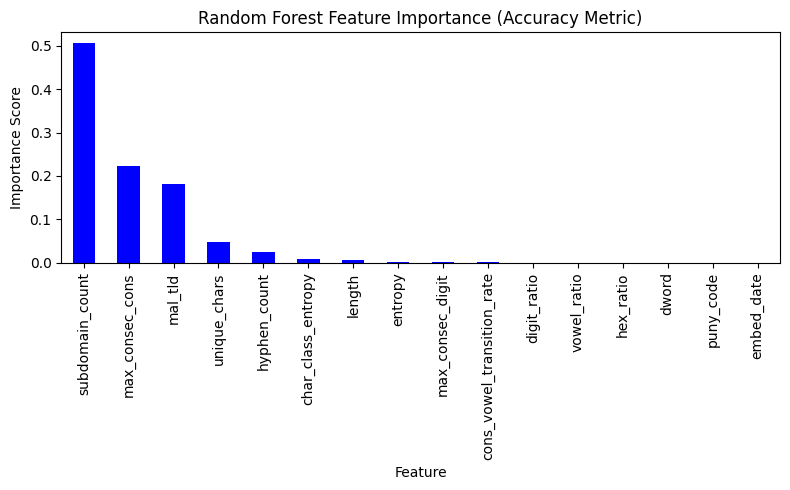

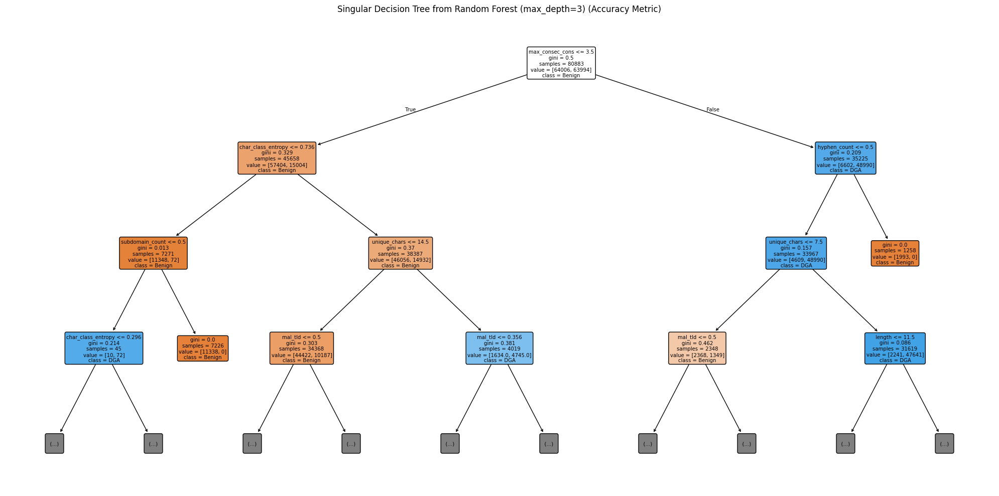

Feature Importance:
subdomain_count               0.506133
max_consec_cons               0.223969
mal_tld                       0.180269
unique_chars                  0.046938
hyphen_count                  0.025207
char_class_entropy            0.008695
length                        0.005272
entropy                       0.001605
max_consec_digit              0.001330
cons_vowel_transition_rate    0.000519
digit_ratio                   0.000047
vowel_ratio                   0.000014
hex_ratio                     0.000000
dword                         0.000000
puny_code                     0.000000
embed_date                    0.000000
dtype: float64


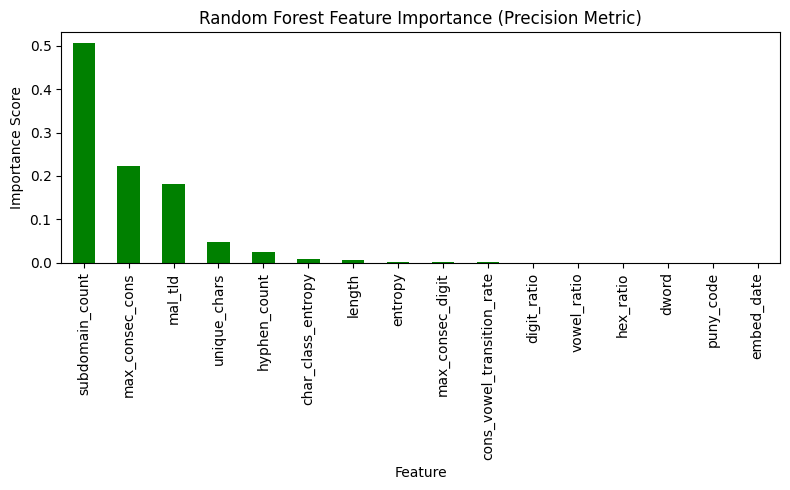

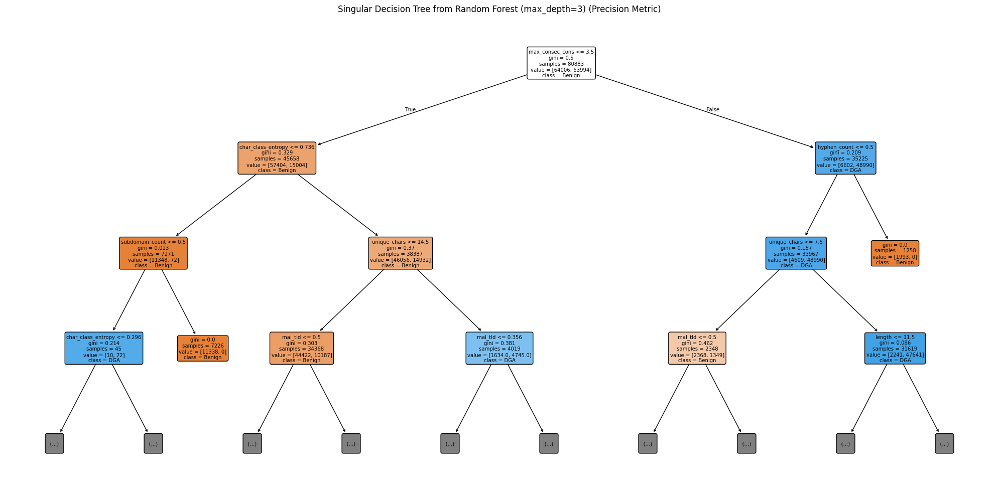

Feature Importance:
max_consec_cons               0.447939
mal_tld                       0.359102
unique_chars                  0.093876
hyphen_count                  0.050165
char_class_entropy            0.017391
subdomain_count               0.013953
length                        0.010544
entropy                       0.003210
max_consec_digit              0.002661
cons_vowel_transition_rate    0.001037
digit_ratio                   0.000095
vowel_ratio                   0.000027
hex_ratio                     0.000000
dword                         0.000000
puny_code                     0.000000
embed_date                    0.000000
dtype: float64


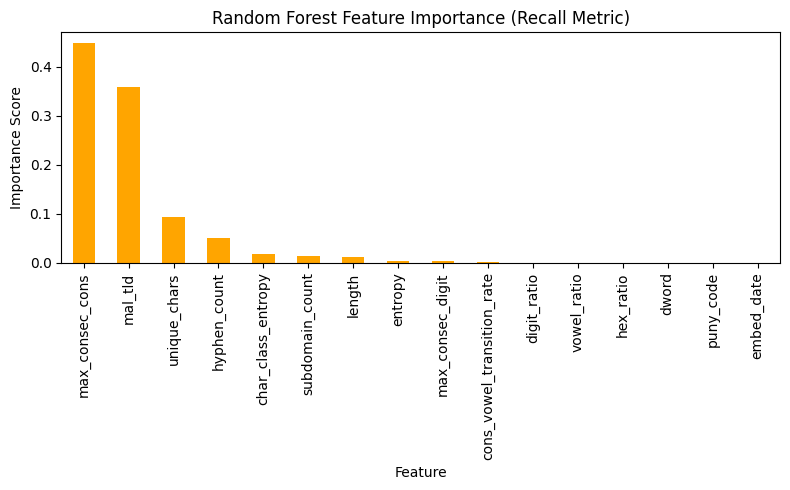

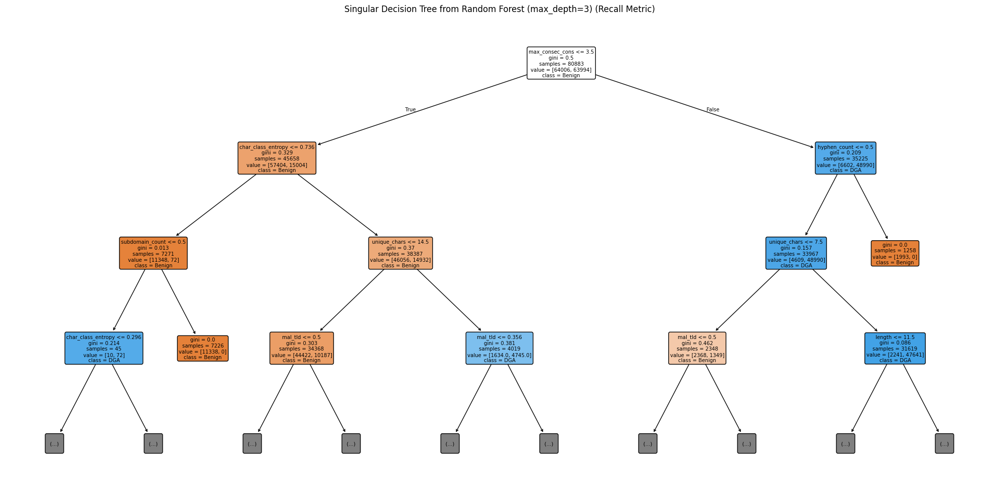

Feature Importance:
subdomain_count               0.506133
max_consec_cons               0.223969
mal_tld                       0.180269
unique_chars                  0.046938
hyphen_count                  0.025207
char_class_entropy            0.008695
length                        0.005272
entropy                       0.001605
max_consec_digit              0.001330
cons_vowel_transition_rate    0.000519
digit_ratio                   0.000047
vowel_ratio                   0.000014
hex_ratio                     0.000000
dword                         0.000000
puny_code                     0.000000
embed_date                    0.000000
dtype: float64


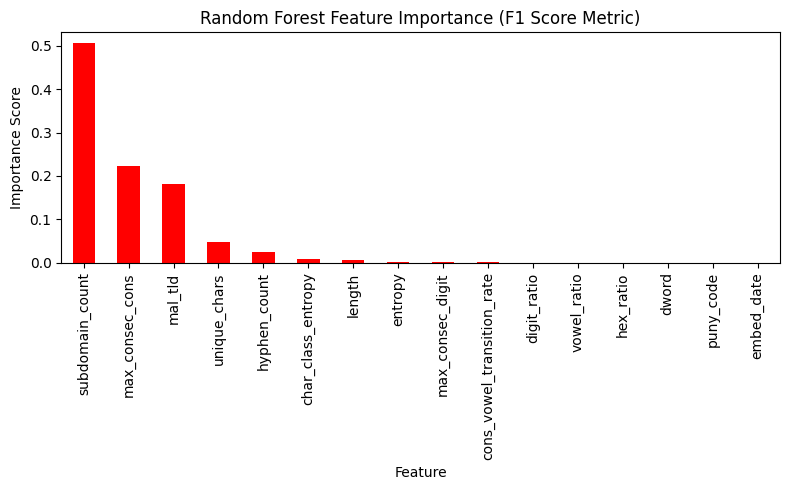

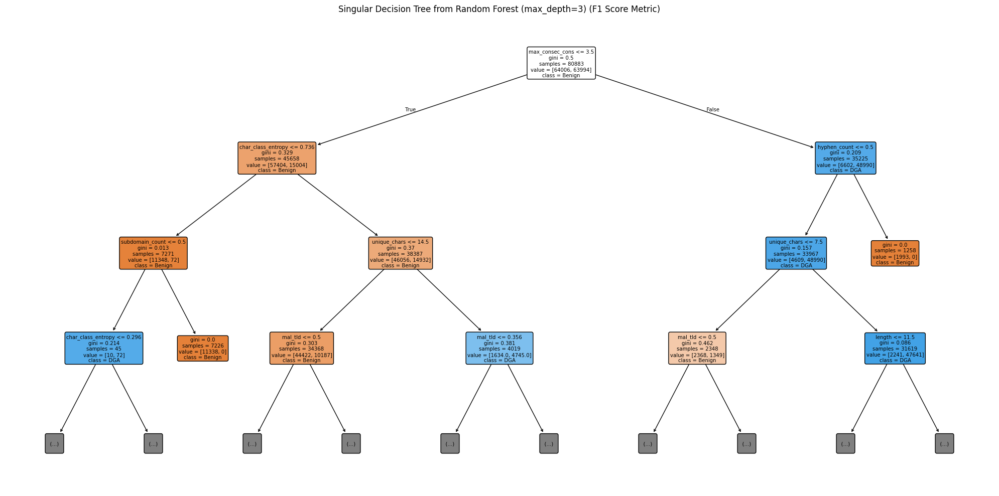

In [34]:
create_best_feature_importance(best_n_acc, "Accuracy", "blue")
create_best_feature_importance(best_n_prec, "Precision", "green")
create_best_feature_importance(best_n_recall, "Recall", "orange")
create_best_feature_importance(best_n_f1, "F1 Score", "red")

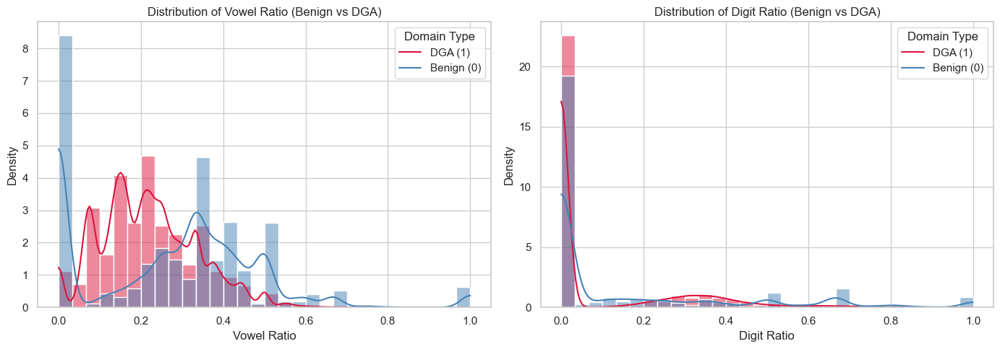

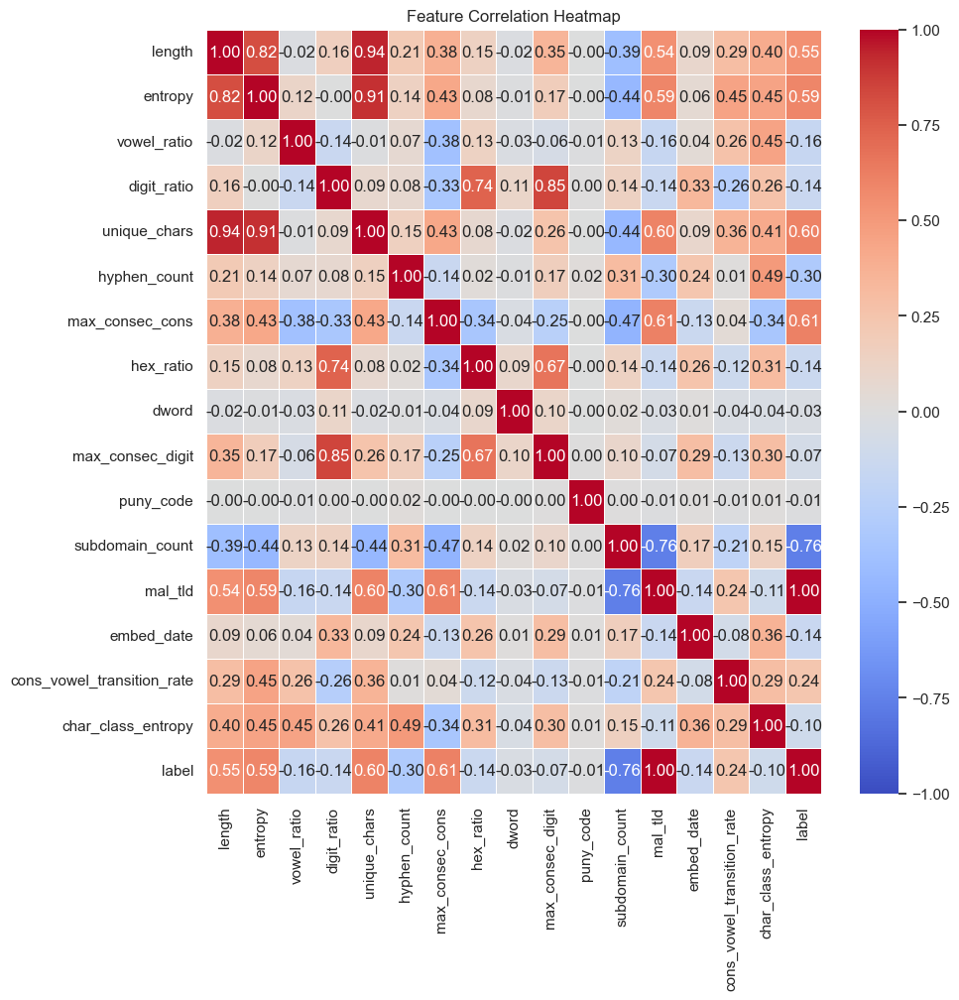

In [35]:
sns.set_theme(style="whitegrid")

# =============================
#Vowel & Digit Ratio
# ================================
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# plot the distribution og vowel_ratio
sns.histplot(data=df, x="vowel_ratio", hue="label", bins=30, kde=True,
             palette=["steelblue", "crimson"], ax=axes[0], stat="density", common_norm=False)
axes[0].set_title("Distribution of Vowel Ratio (Benign vs DGA)")
axes[0].set_xlabel("Vowel Ratio")
axes[0].set_ylabel("Density")
axes[0].legend(title="Domain Type", labels=["DGA (1)", "Benign (0)"])

# plot the distribution of digit_ratio
sns.histplot(data=df, x="digit_ratio", hue="label", bins=30, kde=True,
             palette=["steelblue", "crimson"], ax=axes[1], stat="density", common_norm=False)
axes[1].set_title("Distribution of Digit Ratio (Benign vs DGA)")
axes[1].set_xlabel("Digit Ratio")
axes[1].set_ylabel("Density")
axes[1].legend(title="Domain Type", labels=["DGA (1)", "Benign (0)"])

plt.tight_layout()
plt.show()

# =====================================
# Feature Correlation Heatmap
# ==================================
plt.figure(figsize=(10, 10))
# select the characters
features = ["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "subdomain_count", "mal_tld", "embed_date", "cons_vowel_transition_rate", "char_class_entropy", "label"]
corr_matrix = df[features].corr()

# plot heatmap
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5, vmin=-1, vmax=1)
plt.title("Feature Correlation Heatmap")
plt.show()

Accuracy (n=2):
	False Positive Rate: 0.00000 (0.000%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15977, False Positives=0, False Negatives=0, True Positives=16023

Precision (n=2):
	False Positive Rate: 0.00000 (0.000%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15977, False Positives=0, False Negatives=0, True Positives=16023

Recall (n=1):
	False Positive Rate: 0.00019 (0.019%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15974, False Positives=3, False Negatives=0, True Positives=16023

F1 Score (n=2):
	False Positive Rate: 0.00000 (0.000%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15977, False Positives=0, False Negatives=0, True Positives=16023



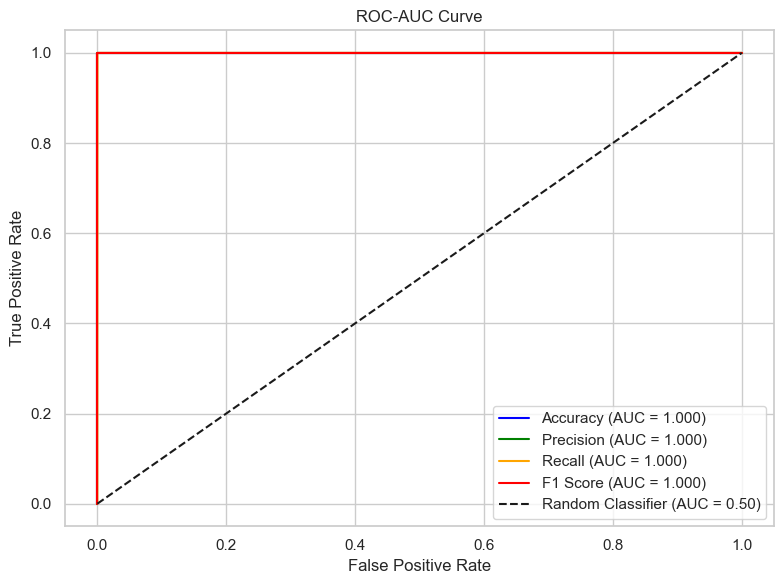

In [36]:
roc_auc_fpr(best_n_acc, best_n_prec, best_n_recall, best_n_f1, X_train, y_train, X_test, y_test)

Testing without Malicious TLDs

Logistic Regression's Accuracy:  0.99990625
Logistic Regression's Precision: 0.9998128041931861
Logistic Regression's Recall:    1.0
Logistic Regression's F1 Score:  0.9999063933352055
Training: 1
Training: 2
Training: 3
Training: 4
Training: 5
Training: 6
Training: 7
Training: 8
Training: 9
Training: 10
Training: 11
Training: 12
Training: 13
Training: 14
Training: 15
Training: 16
Training: 17
Training: 18
Training: 19
Training: 20
Training: 21
Training: 22
Training: 23
Training: 24
Training: 25
Training: 26
Training: 27
Training: 28
Training: 29
Training: 30
Training: 31
Training: 32
Training: 33
Training: 34
Training: 35
Training: 36
Training: 37
Training: 38
Training: 39
Training: 40
Training: 41
Training: 42
Training: 43
Training: 44
Training: 45
Training: 46
Training: 47
Training: 48
Training: 49
Training: 50
Training: 51
Training: 52
Training: 53
Training: 54
Training: 55
Training: 56
Training: 57
Training: 58
Training: 59
Training: 60
Training: 61
Training: 62
Training: 63
Train

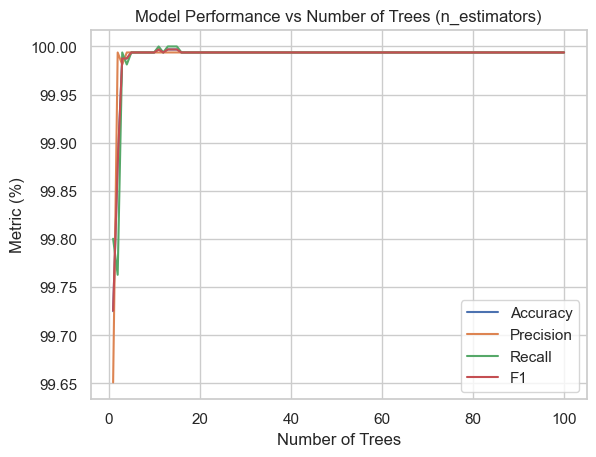

Best n_estimators (Accuracy): 11
Best Accuracy: 0.99996875
Best n_estimators (Precision): 11
Best Precision: 0.9999375936095857
Best n_estimators (Recall): 11
Best Recall: 1.0
Best n_estimators (F1): 11
Best F1: 0.9999687958311231


In [37]:
X = df[["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "subdomain_count", "embed_date", "cons_vowel_transition_rate", "char_class_entropy"]]
y = df["label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=60)

lr = LogisticRegression(max_iter=1000, random_state=60)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(f"Logistic Regression's Accuracy:  {accuracy_score(y_test, y_pred)}")
print(f"Logistic Regression's Precision: {precision_score(y_test, y_pred)}")
print(f"Logistic Regression's Recall:    {recall_score(y_test, y_pred)}")
print(f"Logistic Regression's F1 Score:  {f1_score(y_test, y_pred)}")

scores = {}
num_test_estimators = range(1, 101)
for n in num_test_estimators:
  print("Training:", n)
  clf = RandomForestClassifier(n_estimators=n, random_state=60, n_jobs=-1)
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  scores[n] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1": f1_score(y_test, y_pred)
    }
accuracies = [scores[n]["accuracy"] * 100 for n in num_test_estimators]
precisions = [scores[n]["precision"] * 100 for n in num_test_estimators]
recalls = [scores[n]["recall"] * 100 for n in num_test_estimators]
f1s = [scores[n]["f1"] * 100 for n in num_test_estimators]
plt.plot(num_test_estimators, accuracies, label="Accuracy")
plt.plot(num_test_estimators, precisions, label="Precision")
plt.plot(num_test_estimators, recalls, label="Recall")
plt.plot(num_test_estimators, f1s, label="F1")
plt.xlabel("Number of Trees")
plt.ylabel("Metric (%)")
plt.title("Model Performance vs Number of Trees (n_estimators)")
plt.legend()
plt.grid(True)
plt.show()

best_n_acc = max(scores, key=lambda n: scores[n]["accuracy"])
best_score_acc = scores[best_n_acc]["accuracy"]
print("Best n_estimators (Accuracy):", best_n_acc)
print("Best Accuracy:", best_score_acc)

best_n_prec = max(scores, key=lambda n: scores[n]["precision"])
best_score_prec = scores[best_n_prec]["precision"]
print("Best n_estimators (Precision):", best_n_prec)
print("Best Precision:", best_score_prec)

best_n_recall = max(scores, key=lambda n: scores[n]["recall"])
best_score_recall = scores[best_n_recall]["recall"]
print("Best n_estimators (Recall):", best_n_recall)
print("Best Recall:", best_score_recall)

best_n_f1 = max(scores, key=lambda n: scores[n]["f1"])
best_score_f1 = scores[best_n_f1]["f1"]
print("Best n_estimators (F1):", best_n_f1)
print("Best F1:", best_score_f1)

Feature Importance:
subdomain_count               0.477469
length                        0.147888
max_consec_cons               0.134392
unique_chars                  0.082060
hyphen_count                  0.045968
entropy                       0.045703
char_class_entropy            0.023058
vowel_ratio                   0.012129
digit_ratio                   0.009514
cons_vowel_transition_rate    0.007302
hex_ratio                     0.006193
embed_date                    0.005367
max_consec_digit              0.002954
puny_code                     0.000001
dword                         0.000000
dtype: float64


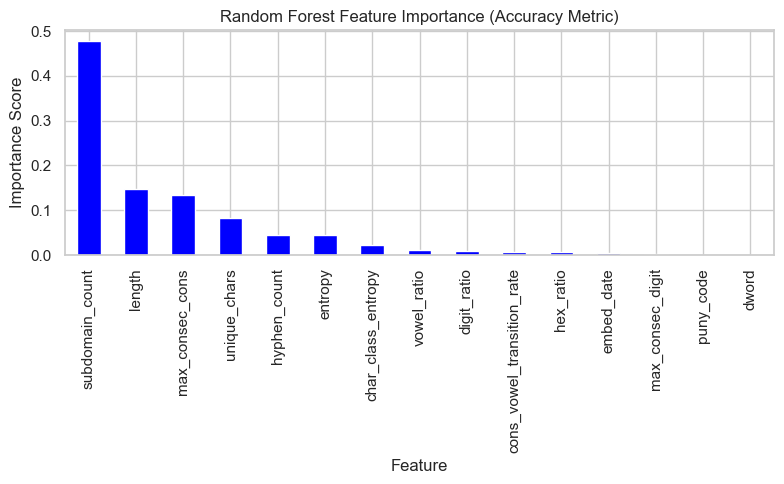

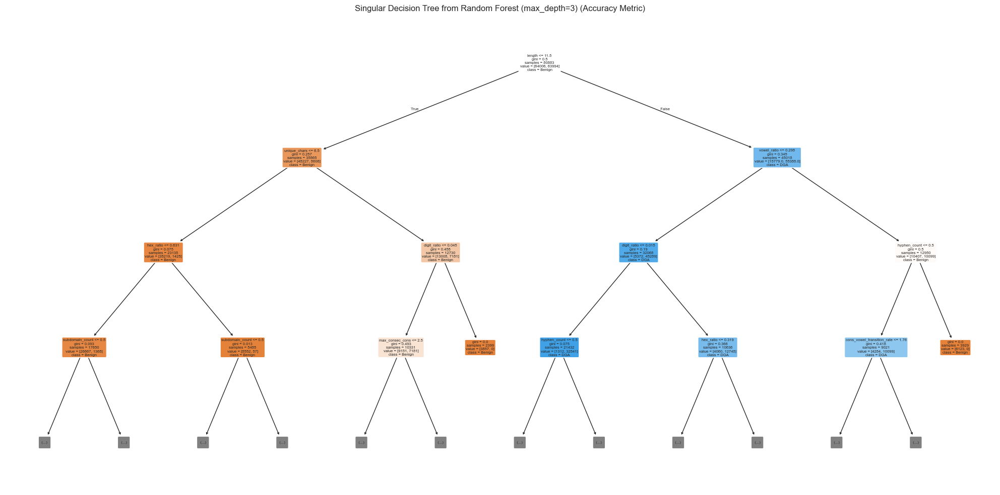

Feature Importance:
subdomain_count               0.477469
length                        0.147888
max_consec_cons               0.134392
unique_chars                  0.082060
hyphen_count                  0.045968
entropy                       0.045703
char_class_entropy            0.023058
vowel_ratio                   0.012129
digit_ratio                   0.009514
cons_vowel_transition_rate    0.007302
hex_ratio                     0.006193
embed_date                    0.005367
max_consec_digit              0.002954
puny_code                     0.000001
dword                         0.000000
dtype: float64


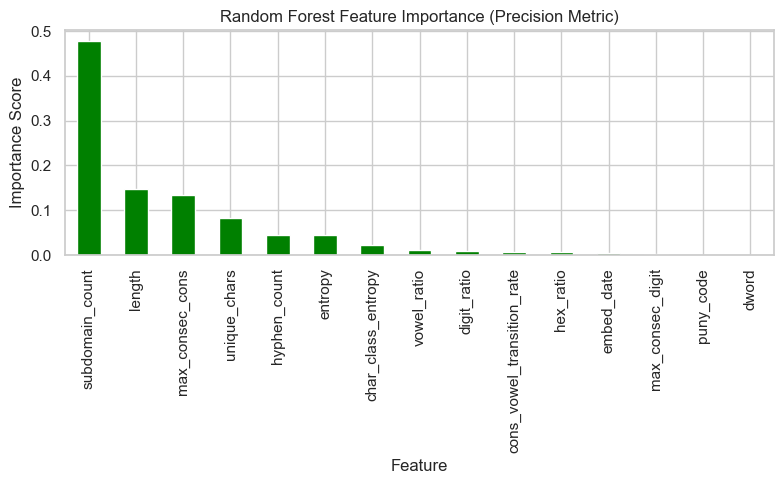

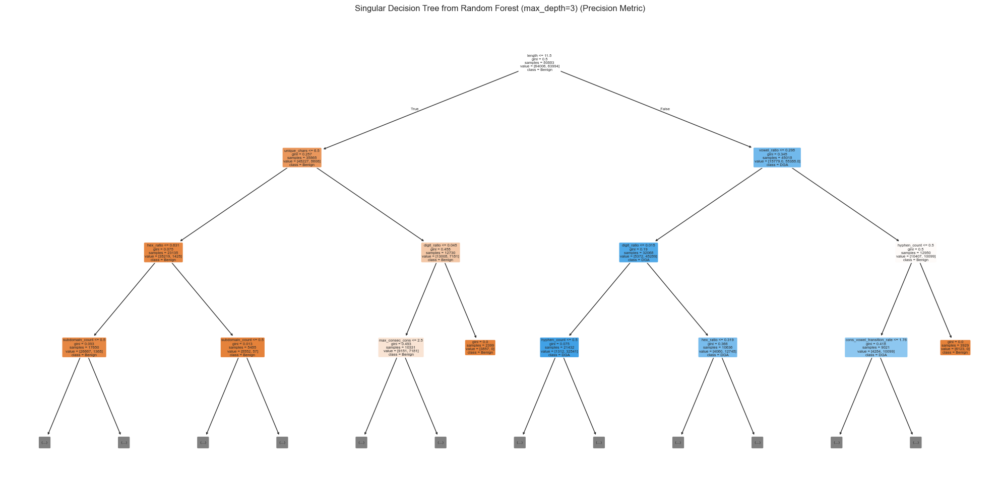

Feature Importance:
subdomain_count               0.477469
length                        0.147888
max_consec_cons               0.134392
unique_chars                  0.082060
hyphen_count                  0.045968
entropy                       0.045703
char_class_entropy            0.023058
vowel_ratio                   0.012129
digit_ratio                   0.009514
cons_vowel_transition_rate    0.007302
hex_ratio                     0.006193
embed_date                    0.005367
max_consec_digit              0.002954
puny_code                     0.000001
dword                         0.000000
dtype: float64


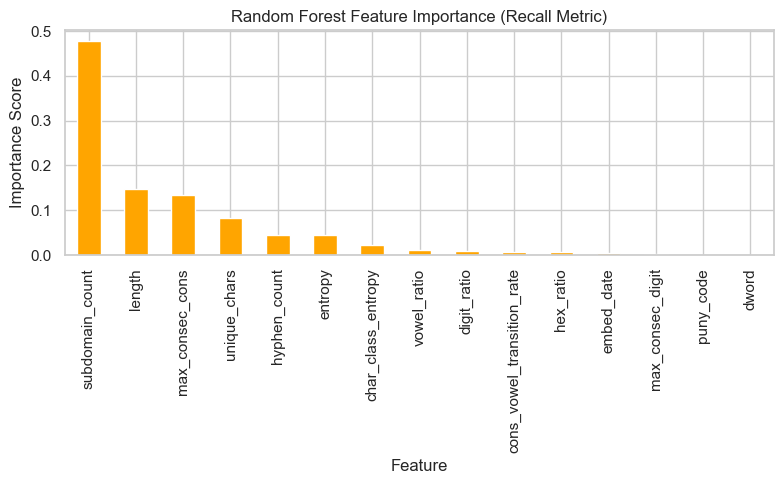

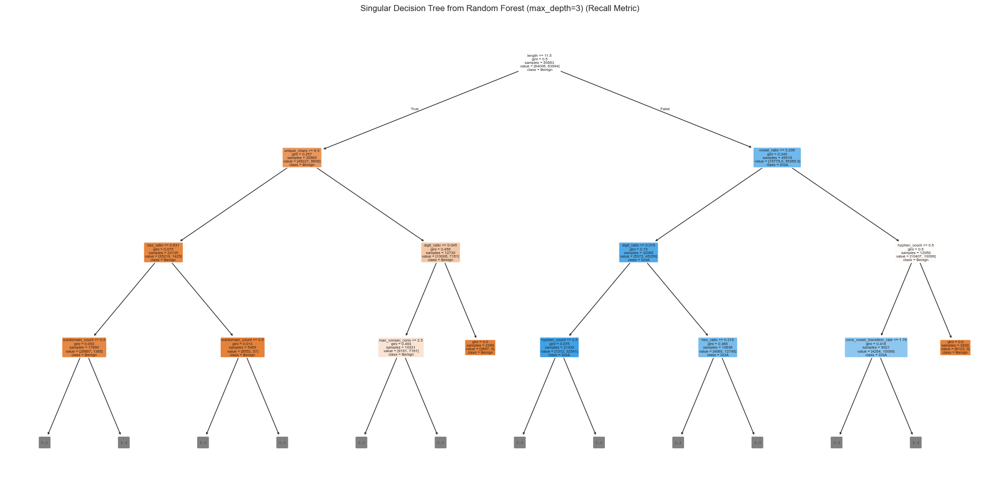

Feature Importance:
subdomain_count               0.477469
length                        0.147888
max_consec_cons               0.134392
unique_chars                  0.082060
hyphen_count                  0.045968
entropy                       0.045703
char_class_entropy            0.023058
vowel_ratio                   0.012129
digit_ratio                   0.009514
cons_vowel_transition_rate    0.007302
hex_ratio                     0.006193
embed_date                    0.005367
max_consec_digit              0.002954
puny_code                     0.000001
dword                         0.000000
dtype: float64


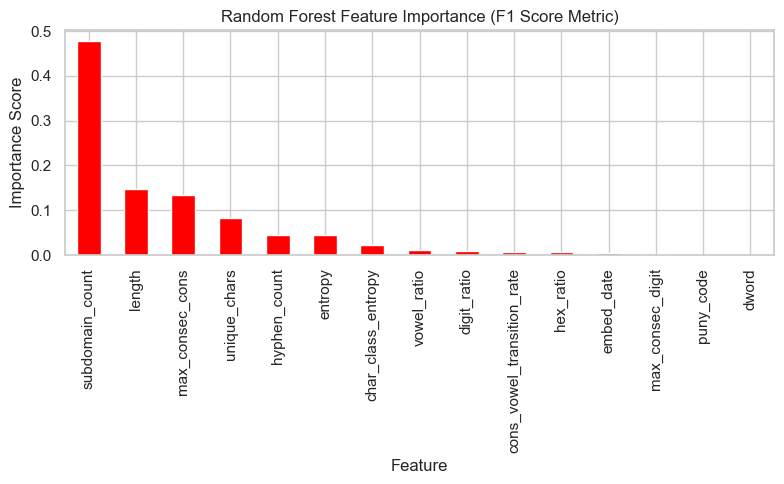

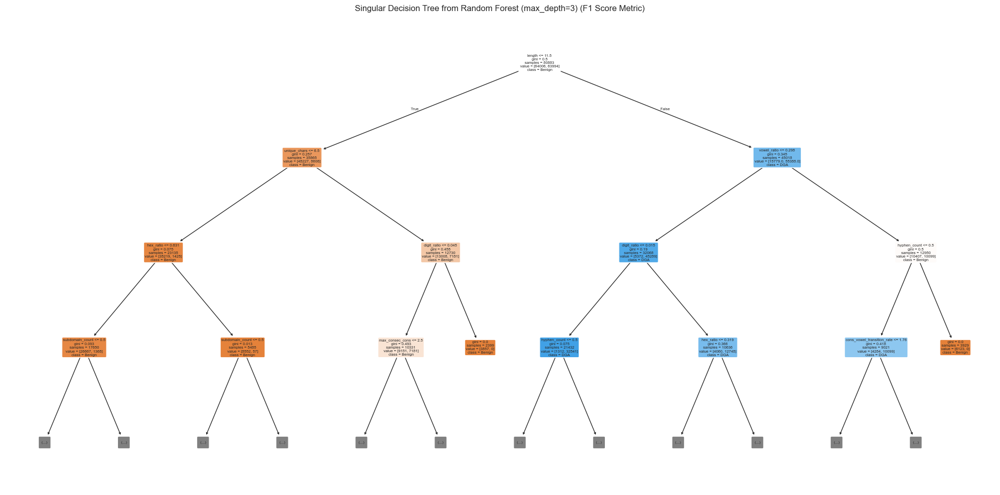

In [38]:
create_best_feature_importance(best_n_acc, "Accuracy", "blue")
create_best_feature_importance(best_n_prec, "Precision", "green")
create_best_feature_importance(best_n_recall, "Recall", "orange")
create_best_feature_importance(best_n_f1, "F1 Score", "red")

Accuracy (n=11):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023

Precision (n=11):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023

Recall (n=11):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023

F1 Score (n=11):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023



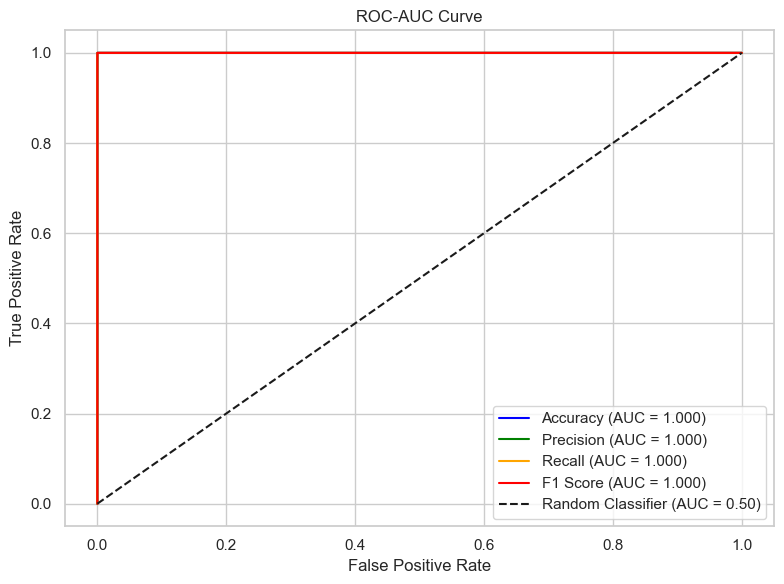

In [39]:
roc_auc_fpr(best_n_acc, best_n_prec, best_n_recall, best_n_f1, X_train, y_train, X_test, y_test)

Find the best combination of features

In [40]:
features = ["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "subdomain_count", "mal_tld", "embed_date"]

benign = df[df["label"] == 0].sample(n=25000, random_state=60)
dga = df[df["label"] == 1].sample(n=25000, random_state=60)
df_sample = pd.concat([benign, dga]).sample(frac=1, random_state=60)
# df_sample = df.sample(n=50000, random_state=60)
y = df_sample["label"]
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=60)
results = []
sample_n_estimators = 20
# test combinations of 3 to 8
for size in range(3, 9):
    for combo in combinations(features, size):
        X_sub = df_sample[list(combo)]
        clf = RandomForestClassifier(n_estimators=sample_n_estimators, random_state=60, n_jobs=-1)
        cv_scores = cross_val_score(clf, X_sub, y, cv=cv, scoring="f1", n_jobs=-1)
        mean_f1 = cv_scores.mean()
        results.append((mean_f1, combo))


results.sort(reverse=True)
print("15 best feature combinations:")
for score, combo in results[:15]:
    print(f"    F1 Score={score} | Length of Features:={len(combo)} | Features: {combo}")

15 best feature combinations:
    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'unique_chars', 'subdomain_count', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=4 | Features: ('vowel_ratio', 'unique_chars', 'subdomain_count', 'mal_tld')
    F1 Score=1.0 | Length of Features:=6 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'subdomain_count', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'subdomain_count', 'mal_tld')
    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=4 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'mal_tld')
    F1 Score=1.0 | Length of Features:=6 | Features: ('vowel_ratio', 'unique_chars', 'max_consec_digit', 'subdomain_count', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'uniqu

In [41]:
for score, combo in results:
    print(f"    F1 Score={score} | Length of Features:={len(combo)} | Features: {combo}")

    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'unique_chars', 'subdomain_count', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=4 | Features: ('vowel_ratio', 'unique_chars', 'subdomain_count', 'mal_tld')
    F1 Score=1.0 | Length of Features:=6 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'subdomain_count', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'subdomain_count', 'mal_tld')
    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=4 | Features: ('vowel_ratio', 'unique_chars', 'puny_code', 'mal_tld')
    F1 Score=1.0 | Length of Features:=6 | Features: ('vowel_ratio', 'unique_chars', 'max_consec_digit', 'subdomain_count', 'mal_tld', 'embed_date')
    F1 Score=1.0 | Length of Features:=5 | Features: ('vowel_ratio', 'unique_chars', 'max_consec_digit', 

Logistic Regression's Accuracy:  0.99990625
Logistic Regression's Precision: 0.9998128041931861
Logistic Regression's Recall:    1.0
Logistic Regression's F1 Score:  0.9999063933352055
Training: 1
Training: 2
Training: 3
Training: 4
Training: 5
Training: 6
Training: 7
Training: 8
Training: 9
Training: 10
Training: 11
Training: 12
Training: 13
Training: 14
Training: 15
Training: 16
Training: 17
Training: 18
Training: 19
Training: 20
Training: 21
Training: 22
Training: 23
Training: 24
Training: 25
Training: 26
Training: 27
Training: 28
Training: 29
Training: 30
Training: 31
Training: 32
Training: 33
Training: 34
Training: 35
Training: 36
Training: 37
Training: 38
Training: 39
Training: 40
Training: 41
Training: 42
Training: 43
Training: 44
Training: 45
Training: 46
Training: 47
Training: 48
Training: 49
Training: 50
Training: 51
Training: 52
Training: 53
Training: 54
Training: 55
Training: 56
Training: 57
Training: 58
Training: 59
Training: 60
Training: 61
Training: 62
Training: 63
Train

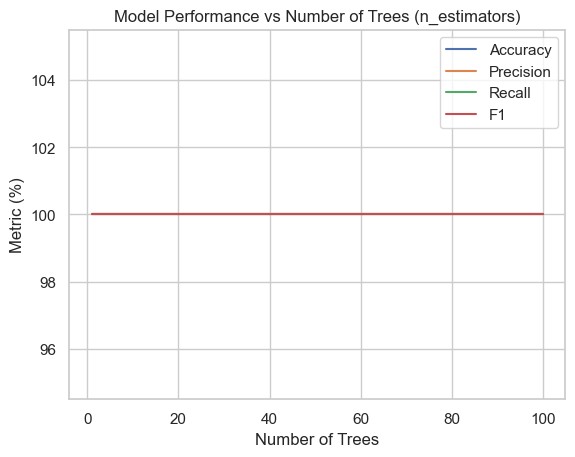

Best n_estimators (Accuracy): 1
Best Accuracy: 1.0
Best n_estimators (Precision): 1
Best Precision: 1.0
Best n_estimators (Recall): 1
Best Recall: 1.0
Best n_estimators (F1): 1
Best F1: 1.0


In [42]:
best_score, best_combo = results[0]
X_best = df[list(best_combo)]
y = df["label"]
X_train, X_test, y_train, y_test = train_test_split(X_best, y, test_size=0.2, random_state=60)

lr = LogisticRegression(max_iter=1000, random_state=60)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(f"Logistic Regression's Accuracy:  {accuracy_score(y_test, y_pred)}")
print(f"Logistic Regression's Precision: {precision_score(y_test, y_pred)}")
print(f"Logistic Regression's Recall:    {recall_score(y_test, y_pred)}")
print(f"Logistic Regression's F1 Score:  {f1_score(y_test, y_pred)}")

scores = {}
num_test_estimators = range(1, 101)
for n in num_test_estimators:
  print("Training:", n)
  clf = RandomForestClassifier(n_estimators=n, random_state=60, n_jobs=-1)
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  scores[n] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1": f1_score(y_test, y_pred)
    }
accuracies = [scores[n]["accuracy"] * 100 for n in num_test_estimators]
precisions = [scores[n]["precision"] * 100 for n in num_test_estimators]
recalls = [scores[n]["recall"] * 100 for n in num_test_estimators]
f1s = [scores[n]["f1"] * 100 for n in num_test_estimators]
plt.plot(num_test_estimators, accuracies, label="Accuracy")
plt.plot(num_test_estimators, precisions, label="Precision")
plt.plot(num_test_estimators, recalls, label="Recall")
plt.plot(num_test_estimators, f1s, label="F1")
plt.xlabel("Number of Trees")
plt.ylabel("Metric (%)")
plt.title("Model Performance vs Number of Trees (n_estimators)")
plt.legend()
plt.grid(True)
plt.show()

best_n_acc = max(scores, key=lambda n: scores[n]["accuracy"])
best_score_acc = scores[best_n_acc]["accuracy"]
print("Best n_estimators (Accuracy):", best_n_acc)
print("Best Accuracy:", best_score_acc)

best_n_prec = max(scores, key=lambda n: scores[n]["precision"])
best_score_prec = scores[best_n_prec]["precision"]
print("Best n_estimators (Precision):", best_n_prec)
print("Best Precision:", best_score_prec)

best_n_recall = max(scores, key=lambda n: scores[n]["recall"])
best_score_recall = scores[best_n_recall]["recall"]
print("Best n_estimators (Recall):", best_n_recall)
print("Best Recall:", best_score_recall)

best_n_f1 = max(scores, key=lambda n: scores[n]["f1"])
best_score_f1 = scores[best_n_f1]["f1"]
print("Best n_estimators (F1):", best_n_f1)
print("Best F1:", best_score_f1)

In [43]:
def create_best_feature_importance(best_n, ver, color):
    best_clf = RandomForestClassifier(n_estimators=best_n, random_state=60)
    best_clf.fit(X_train, y_train)
    feature_importance = pd.Series(best_clf.feature_importances_, index=X_best.columns).sort_values(ascending=False)
    print("Feature Importance:\n" + str(feature_importance))
    plt.figure(figsize=(8,5))
    feature_importance.plot(kind="bar", color=color)
    plt.xlabel("Feature")
    plt.ylabel("Importance Score")
    plt.title(f"Random Forest Feature Importance ({ver} Metric)")
    # plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    single_tree = best_clf.estimators_[0]
    fig, ax = plt.subplots(figsize=(20, 10))
    plot_tree(
        single_tree,
        feature_names=X_best.columns.tolist(),
        class_names=["Benign", "DGA"],
        filled=True,
        rounded=True,
        max_depth=3,
        ax=ax
    )
    plt.title(f"Singular Decision Tree from Random Forest (max_depth=3) ({ver} Metric)")
    plt.tight_layout()
    plt.show()

Feature Importance:
subdomain_count    0.998876
mal_tld            0.001124
vowel_ratio        0.000000
unique_chars       0.000000
embed_date         0.000000
dtype: float64


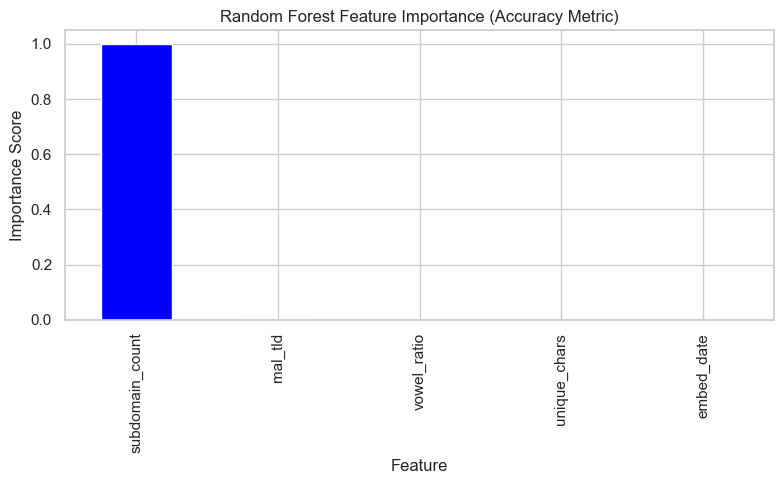

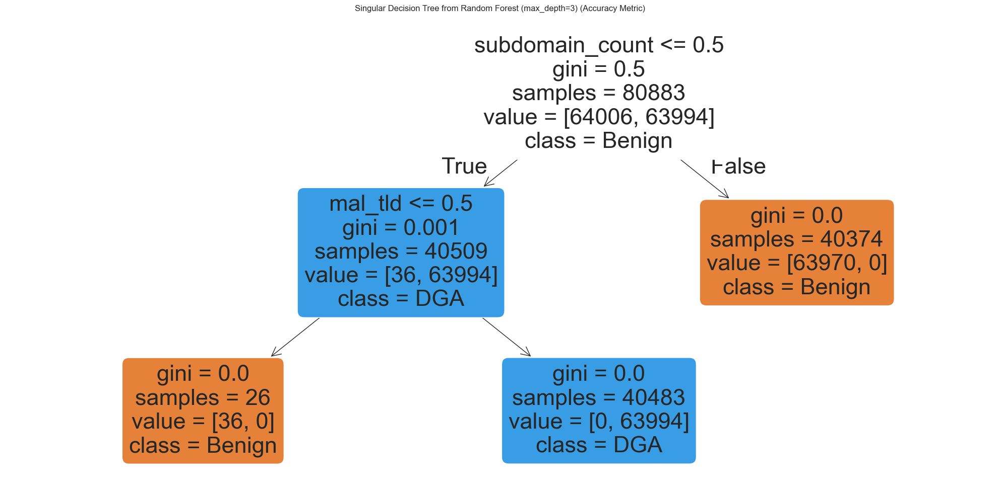

Feature Importance:
subdomain_count    0.998876
mal_tld            0.001124
vowel_ratio        0.000000
unique_chars       0.000000
embed_date         0.000000
dtype: float64


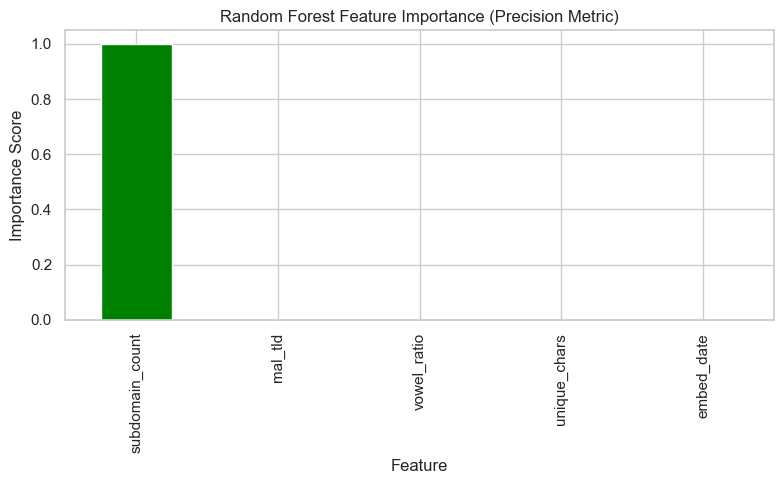

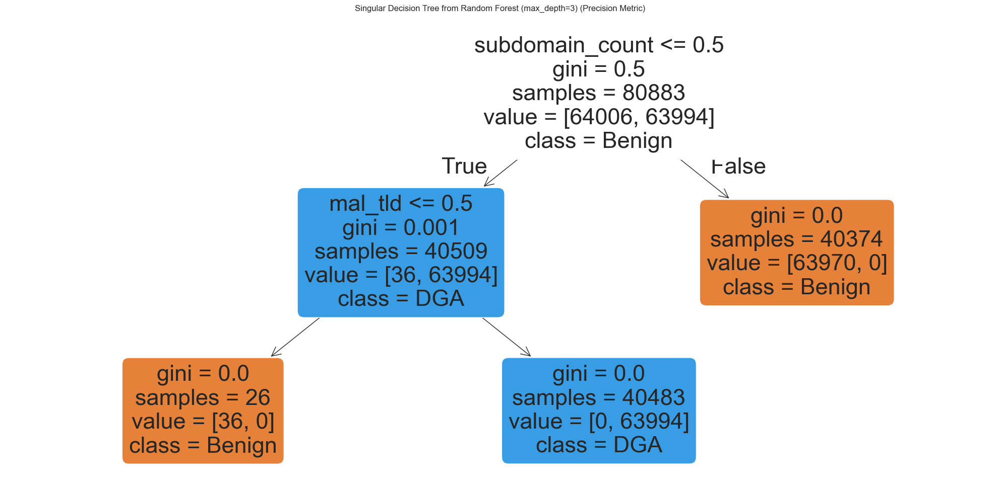

Feature Importance:
subdomain_count    0.998876
mal_tld            0.001124
vowel_ratio        0.000000
unique_chars       0.000000
embed_date         0.000000
dtype: float64


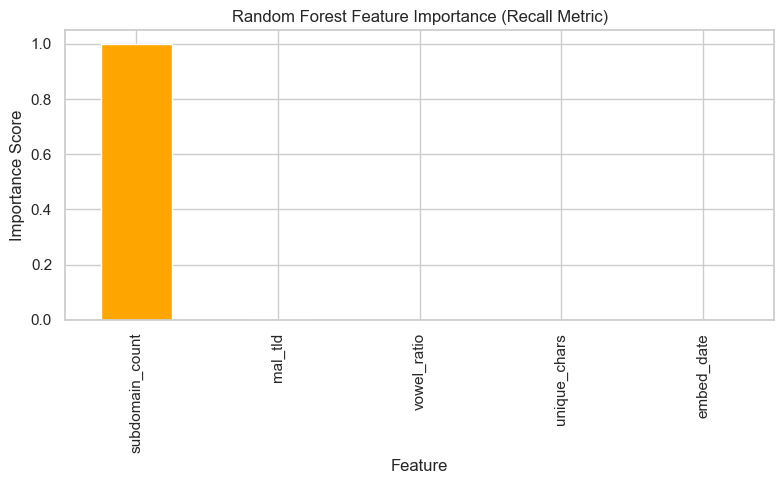

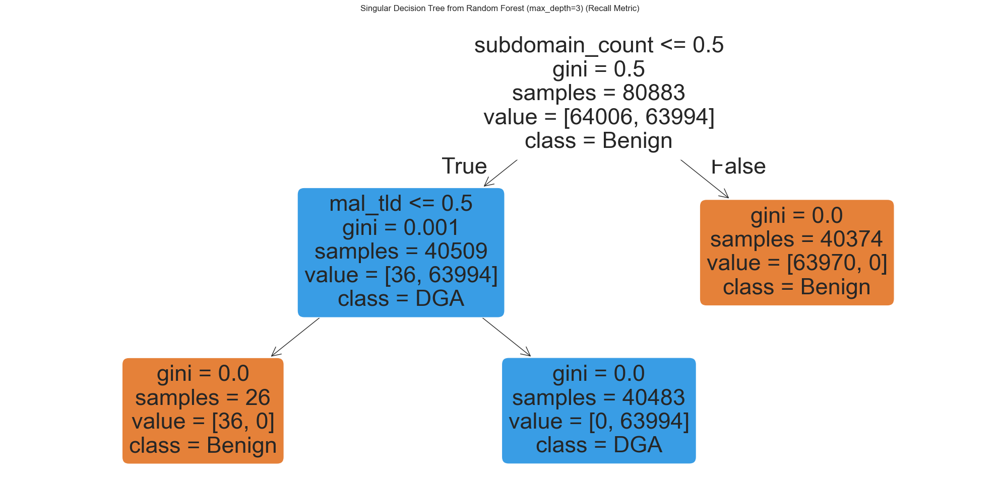

Feature Importance:
subdomain_count    0.998876
mal_tld            0.001124
vowel_ratio        0.000000
unique_chars       0.000000
embed_date         0.000000
dtype: float64


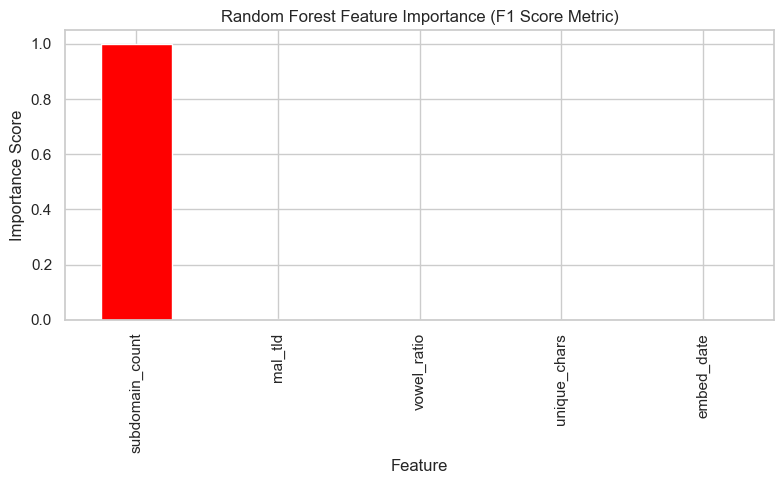

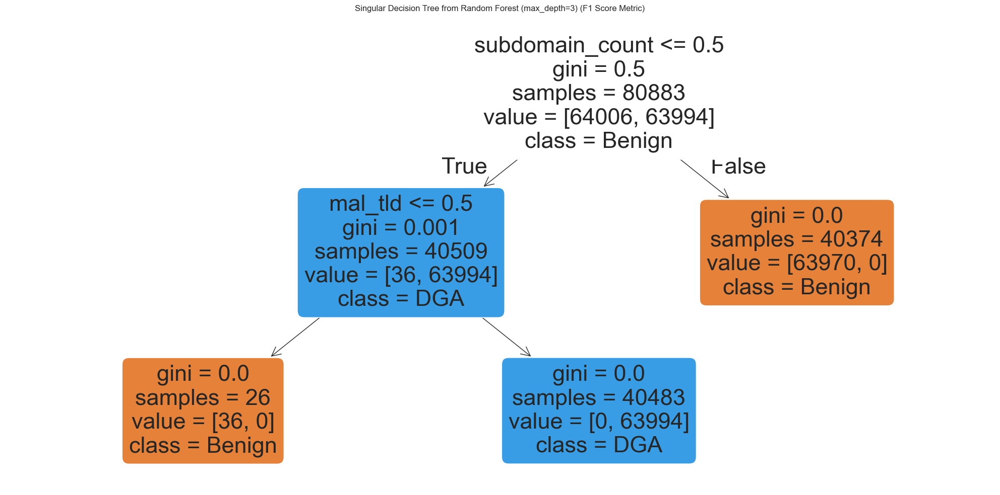

In [44]:
create_best_feature_importance(best_n_acc, "Accuracy", "blue")
create_best_feature_importance(best_n_prec, "Precision", "green")
create_best_feature_importance(best_n_recall, "Recall", "orange")
create_best_feature_importance(best_n_f1, "F1 Score", "red")

Accuracy (n=1):
	False Positive Rate: 0.00000 (0.000%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15977, False Positives=0, False Negatives=0, True Positives=16023

Precision (n=1):
	False Positive Rate: 0.00000 (0.000%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15977, False Positives=0, False Negatives=0, True Positives=16023

Recall (n=1):
	False Positive Rate: 0.00000 (0.000%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15977, False Positives=0, False Negatives=0, True Positives=16023

F1 Score (n=1):
	False Positive Rate: 0.00000 (0.000%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15977, False Positives=0, False Negatives=0, True Positives=16023



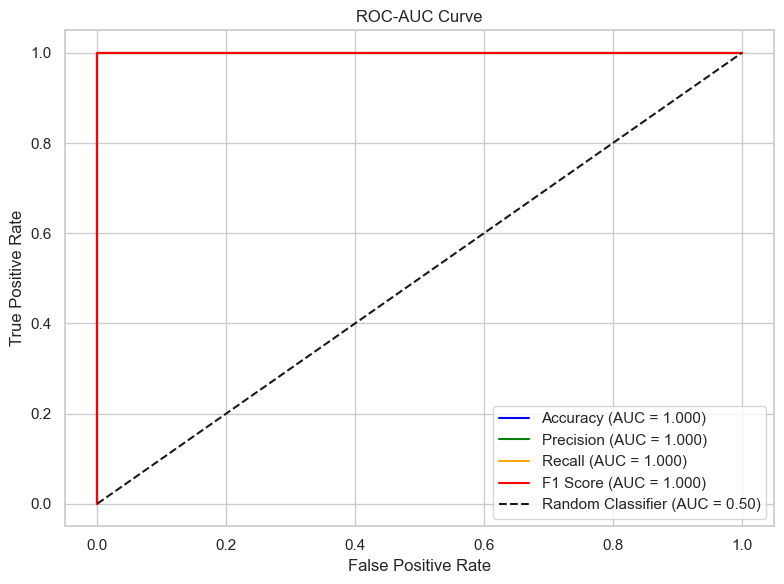

In [45]:
roc_auc_fpr(best_n_acc, best_n_prec, best_n_recall, best_n_f1, X_train, y_train, X_test, y_test)

Combinations without Malicious TLDs

In [46]:
features = ["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "subdomain_count", "embed_date"]

benign = df[df["label"] == 0].sample(n=25000, random_state=60)
dga = df[df["label"] == 1].sample(n=25000, random_state=60)
df_sample = pd.concat([benign, dga]).sample(frac=1, random_state=60)
# df_sample = df.sample(n=50000, random_state=60)
y = df_sample["label"]
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=60)
results = []
sample_n_estimators = 20
# test combinations of 3 to 8
for size in range(3, 9):
    for combo in combinations(features, size):
        X_sub = df_sample[list(combo)]
        clf = RandomForestClassifier(n_estimators=sample_n_estimators, random_state=60, n_jobs=-1)
        cv_scores = cross_val_score(clf, X_sub, y, cv=cv, scoring="f1", n_jobs=-1)
        mean_f1 = cv_scores.mean()
        results.append((mean_f1, combo))


results.sort(reverse=True)
print("15 best feature combinations:")
for score, combo in results[:15]:
    print(f"    F1 Score={score} | Length of Features:={len(combo)} | Features: {combo}")

15 best feature combinations:
    F1 Score=0.9999200159968007 | Length of Features:=8 | Features: ('length', 'vowel_ratio', 'digit_ratio', 'unique_chars', 'hyphen_count', 'hex_ratio', 'max_consec_digit', 'subdomain_count')
    F1 Score=0.9999200159968007 | Length of Features:=7 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_digit', 'puny_code', 'subdomain_count', 'embed_date')
    F1 Score=0.9999200159968007 | Length of Features:=6 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_digit', 'puny_code', 'subdomain_count')
    F1 Score=0.9999200159968007 | Length of Features:=7 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_cons', 'dword', 'subdomain_count', 'embed_date')
    F1 Score=0.9999200159968007 | Length of Features:=8 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'puny_code', 'subdomain_count')
    F1 Score=0.9999200159968007 | Length of Features:=7 | Features: ('leng

In [47]:
for score, combo in results:
    print(f"    F1 Score={score} | Length of Features:={len(combo)} | Features: {combo}")

    F1 Score=0.9999200159968007 | Length of Features:=8 | Features: ('length', 'vowel_ratio', 'digit_ratio', 'unique_chars', 'hyphen_count', 'hex_ratio', 'max_consec_digit', 'subdomain_count')
    F1 Score=0.9999200159968007 | Length of Features:=7 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_digit', 'puny_code', 'subdomain_count', 'embed_date')
    F1 Score=0.9999200159968007 | Length of Features:=6 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_digit', 'puny_code', 'subdomain_count')
    F1 Score=0.9999200159968007 | Length of Features:=7 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_cons', 'dword', 'subdomain_count', 'embed_date')
    F1 Score=0.9999200159968007 | Length of Features:=8 | Features: ('length', 'unique_chars', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'puny_code', 'subdomain_count')
    F1 Score=0.9999200159968007 | Length of Features:=7 | Features: ('length', 'unique_chars', 'hyphen_c

Logistic Regression's Accuracy:  0.99990625
Logistic Regression's Precision: 0.9998128041931861
Logistic Regression's Recall:    1.0
Logistic Regression's F1 Score:  0.9999063933352055
Training: 1
Training: 2
Training: 3
Training: 4
Training: 5
Training: 6
Training: 7
Training: 8
Training: 9
Training: 10
Training: 11
Training: 12
Training: 13
Training: 14
Training: 15
Training: 16
Training: 17
Training: 18
Training: 19
Training: 20
Training: 21
Training: 22
Training: 23
Training: 24
Training: 25
Training: 26
Training: 27
Training: 28
Training: 29
Training: 30
Training: 31
Training: 32
Training: 33
Training: 34
Training: 35
Training: 36
Training: 37
Training: 38
Training: 39
Training: 40
Training: 41
Training: 42
Training: 43
Training: 44
Training: 45
Training: 46
Training: 47
Training: 48
Training: 49
Training: 50
Training: 51
Training: 52
Training: 53
Training: 54
Training: 55
Training: 56
Training: 57
Training: 58
Training: 59
Training: 60
Training: 61
Training: 62
Training: 63
Train

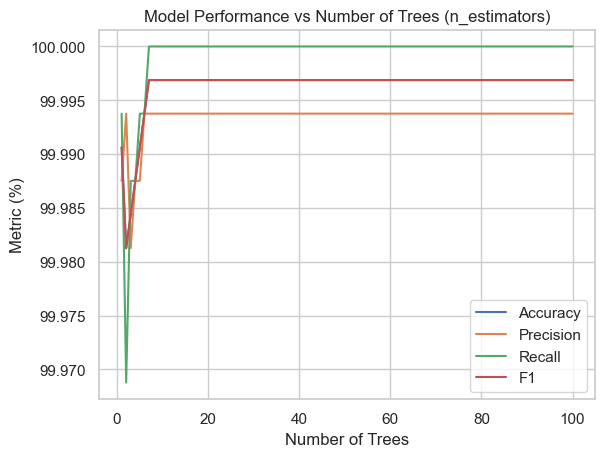

Best n_estimators (Accuracy): 7
Best Accuracy: 0.99996875
Best n_estimators (Precision): 7
Best Precision: 0.9999375936095857
Best n_estimators (Recall): 7
Best Recall: 1.0
Best n_estimators (F1): 7
Best F1: 0.9999687958311231


In [48]:
best_score, best_combo = results[0]
X_best = df[list(best_combo)]
y = df["label"]
X_train, X_test, y_train, y_test = train_test_split(X_best, y, test_size=0.2, random_state=60)

lr = LogisticRegression(max_iter=1000, random_state=60)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(f"Logistic Regression's Accuracy:  {accuracy_score(y_test, y_pred)}")
print(f"Logistic Regression's Precision: {precision_score(y_test, y_pred)}")
print(f"Logistic Regression's Recall:    {recall_score(y_test, y_pred)}")
print(f"Logistic Regression's F1 Score:  {f1_score(y_test, y_pred)}")

scores = {}
num_test_estimators = range(1, 101)
for n in num_test_estimators:
  print("Training:", n)
  clf = RandomForestClassifier(n_estimators=n, random_state=60, n_jobs=-1)
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  scores[n] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1": f1_score(y_test, y_pred)
    }
accuracies = [scores[n]["accuracy"] * 100 for n in num_test_estimators]
precisions = [scores[n]["precision"] * 100 for n in num_test_estimators]
recalls = [scores[n]["recall"] * 100 for n in num_test_estimators]
f1s = [scores[n]["f1"] * 100 for n in num_test_estimators]
plt.plot(num_test_estimators, accuracies, label="Accuracy")
plt.plot(num_test_estimators, precisions, label="Precision")
plt.plot(num_test_estimators, recalls, label="Recall")
plt.plot(num_test_estimators, f1s, label="F1")
plt.xlabel("Number of Trees")
plt.ylabel("Metric (%)")
plt.title("Model Performance vs Number of Trees (n_estimators)")
plt.legend()
plt.grid(True)
plt.show()

best_n_acc = max(scores, key=lambda n: scores[n]["accuracy"])
best_score_acc = scores[best_n_acc]["accuracy"]
print("Best n_estimators (Accuracy):", best_n_acc)
print("Best Accuracy:", best_score_acc)

best_n_prec = max(scores, key=lambda n: scores[n]["precision"])
best_score_prec = scores[best_n_prec]["precision"]
print("Best n_estimators (Precision):", best_n_prec)
print("Best Precision:", best_score_prec)

best_n_recall = max(scores, key=lambda n: scores[n]["recall"])
best_score_recall = scores[best_n_recall]["recall"]
print("Best n_estimators (Recall):", best_n_recall)
print("Best Recall:", best_score_recall)

best_n_f1 = max(scores, key=lambda n: scores[n]["f1"])
best_score_f1 = scores[best_n_f1]["f1"]
print("Best n_estimators (F1):", best_n_f1)
print("Best F1:", best_score_f1)

Feature Importance:
subdomain_count     0.571562
unique_chars        0.153156
length              0.130949
hyphen_count        0.092938
vowel_ratio         0.035749
digit_ratio         0.010197
max_consec_digit    0.003567
hex_ratio           0.001881
dtype: float64


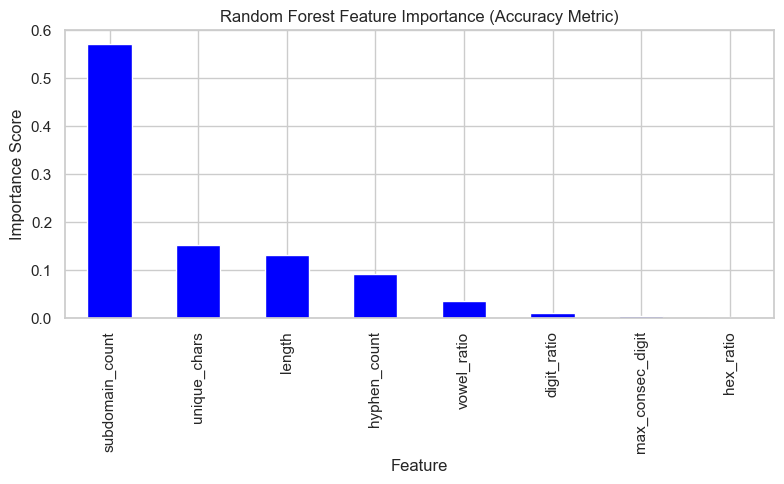

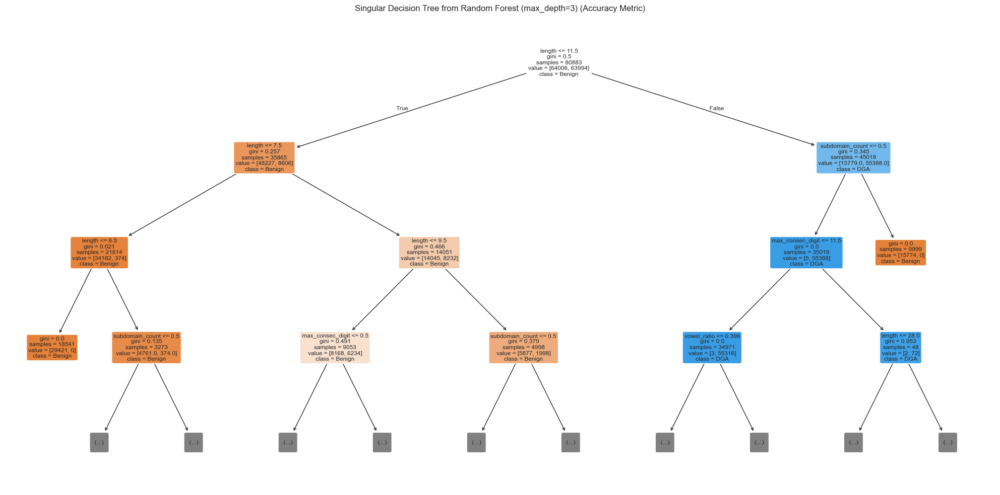

Feature Importance:
subdomain_count     0.571562
unique_chars        0.153156
length              0.130949
hyphen_count        0.092938
vowel_ratio         0.035749
digit_ratio         0.010197
max_consec_digit    0.003567
hex_ratio           0.001881
dtype: float64


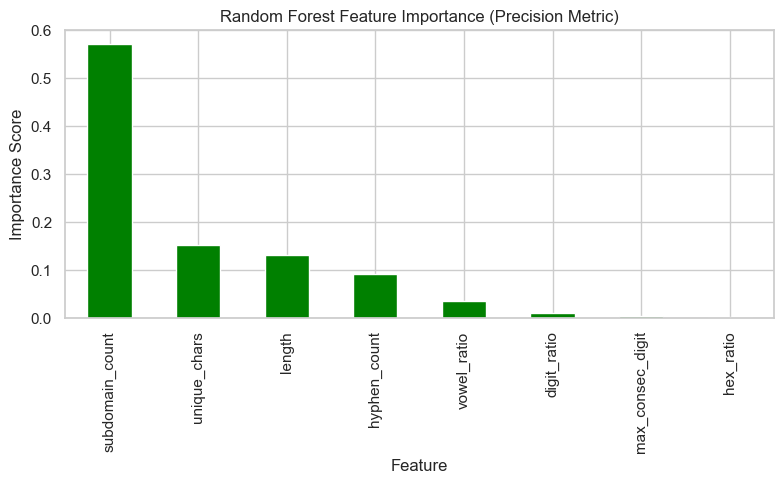

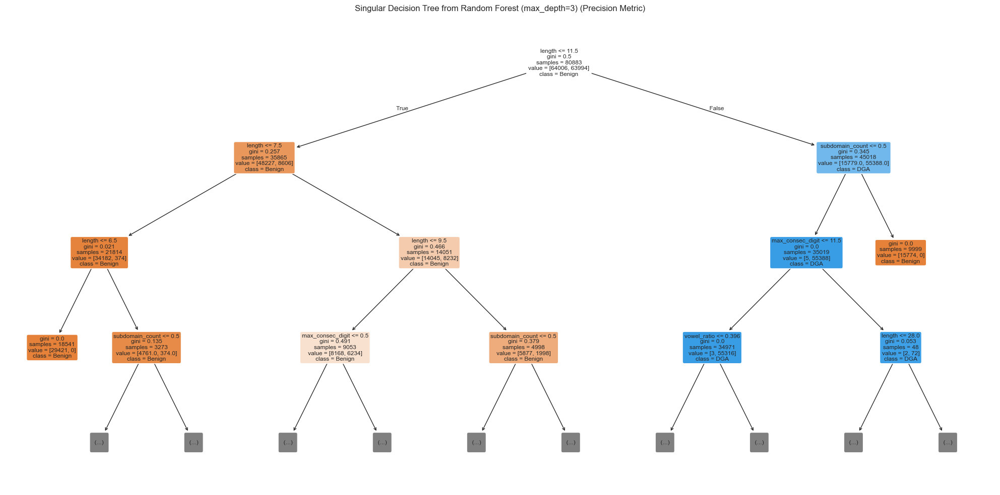

Feature Importance:
subdomain_count     0.571562
unique_chars        0.153156
length              0.130949
hyphen_count        0.092938
vowel_ratio         0.035749
digit_ratio         0.010197
max_consec_digit    0.003567
hex_ratio           0.001881
dtype: float64


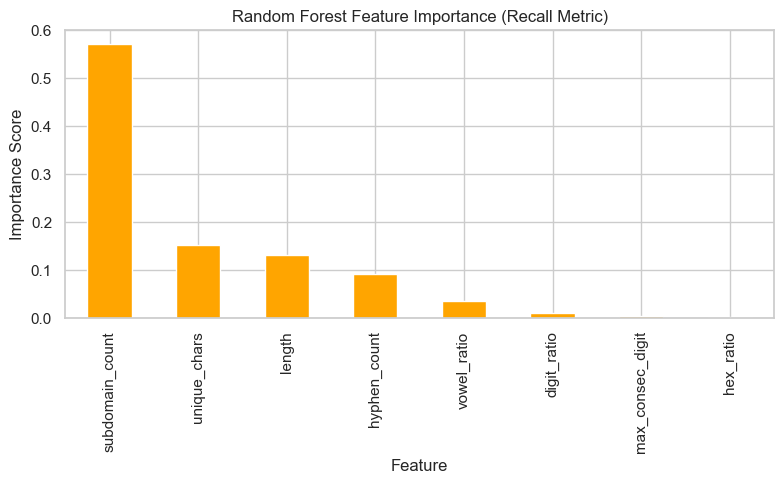

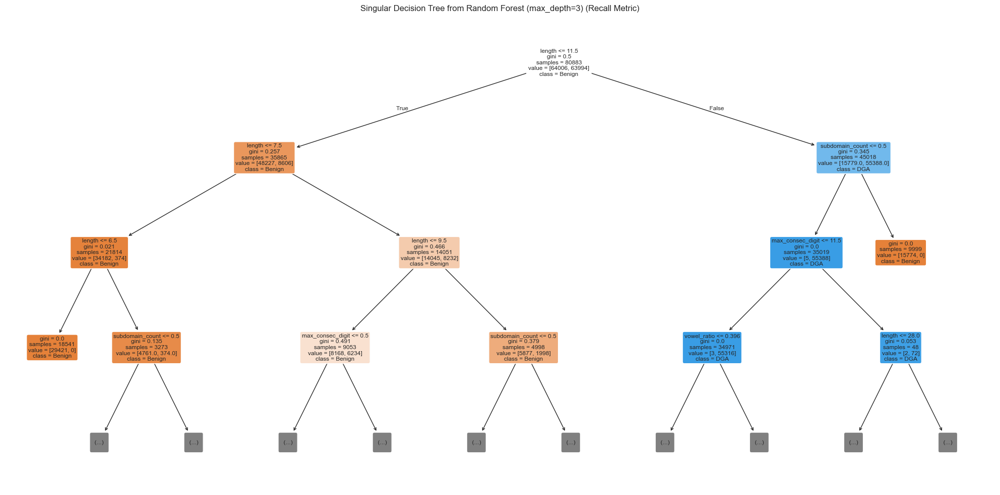

Feature Importance:
subdomain_count     0.571562
unique_chars        0.153156
length              0.130949
hyphen_count        0.092938
vowel_ratio         0.035749
digit_ratio         0.010197
max_consec_digit    0.003567
hex_ratio           0.001881
dtype: float64


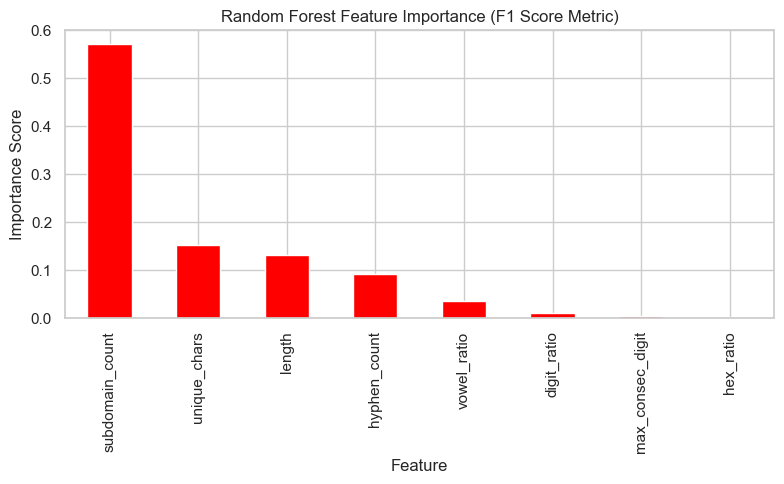

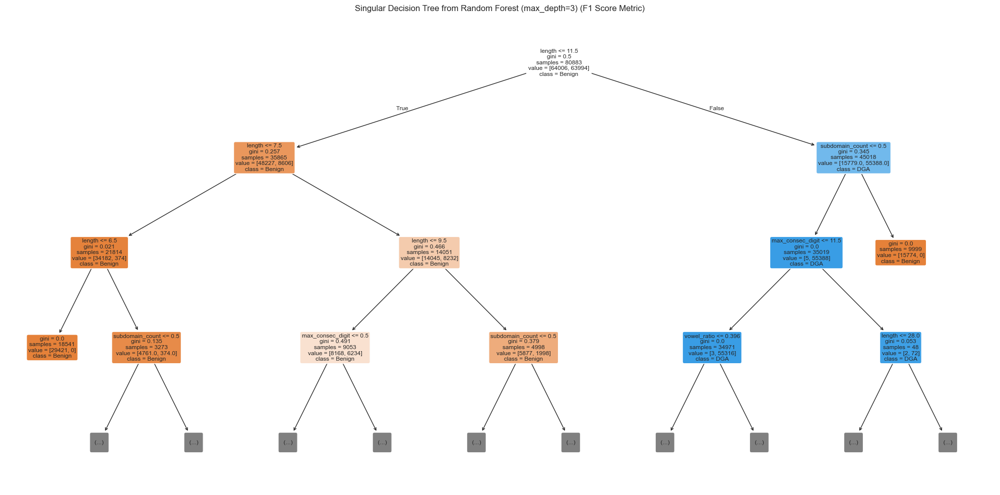

In [49]:
create_best_feature_importance(best_n_acc, "Accuracy", "blue")
create_best_feature_importance(best_n_prec, "Precision", "green")
create_best_feature_importance(best_n_recall, "Recall", "orange")
create_best_feature_importance(best_n_f1, "F1 Score", "red")

Accuracy (n=7):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023

Precision (n=7):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023

Recall (n=7):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023

F1 Score (n=7):
	False Positive Rate: 0.00006 (0.006%)
	False Negative Rate: 0.00000 (0.000%)
	True Negatives=15976, False Positives=1, False Negatives=0, True Positives=16023



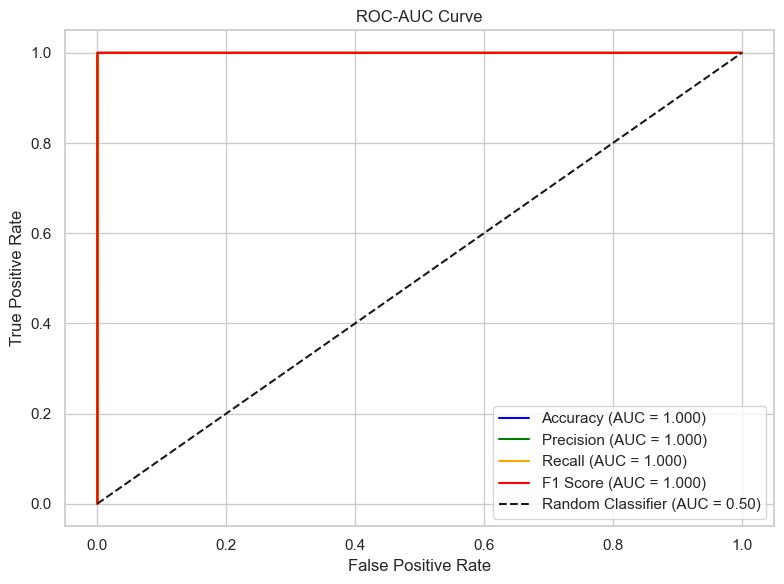

In [50]:
roc_auc_fpr(best_n_acc, best_n_prec, best_n_recall, best_n_f1, X_train, y_train, X_test, y_test)

Combinations without malicious TLD and subdomain count

In [51]:
features = ["length", "entropy", "vowel_ratio", "digit_ratio", "unique_chars", "hyphen_count", "max_consec_cons", "hex_ratio", "dword", "max_consec_digit", "puny_code", "embed_date"]

benign = df[df["label"] == 0].sample(n=25000, random_state=60)
dga = df[df["label"] == 1].sample(n=25000, random_state=60)
df_sample = pd.concat([benign, dga]).sample(frac=1, random_state=60)
# df_sample = df.sample(n=50000, random_state=60)
y = df_sample["label"]
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=60)
results = []
sample_n_estimators = 20
# test combinations of 3 to 8
for size in range(3, 9):
    for combo in combinations(features, size):
        X_sub = df_sample[list(combo)]
        clf = RandomForestClassifier(n_estimators=sample_n_estimators, random_state=60, n_jobs=-1)
        cv_scores = cross_val_score(clf, X_sub, y, cv=cv, scoring="f1", n_jobs=-1)
        mean_f1 = cv_scores.mean()
        results.append((mean_f1, combo))


results.sort(reverse=True)
print("15 best feature combinations:")
for score, combo in results[:15]:
    print(f"    F1 Score={score} | Length of Features:={len(combo)} | Features: {combo}")

15 best feature combinations:
    F1 Score=0.9260808372951365 | Length of Features:=6 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'max_consec_digit', 'puny_code')
    F1 Score=0.926061867943344 | Length of Features:=6 | Features: ('length', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'puny_code')
    F1 Score=0.9260500443539608 | Length of Features:=7 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'embed_date')
    F1 Score=0.9260415183724102 | Length of Features:=7 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'puny_code')
    F1 Score=0.9260415037468439 | Length of Features:=6 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit')
    F1 Score=0.9260408869824628 | Length of Features:=6 | Features: ('length', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'embed_da

In [52]:
for score, combo in results:
    print(f"    F1 Score={score} | Length of Features:={len(combo)} | Features: {combo}")

    F1 Score=0.9260808372951365 | Length of Features:=6 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'max_consec_digit', 'puny_code')
    F1 Score=0.926061867943344 | Length of Features:=6 | Features: ('length', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'puny_code')
    F1 Score=0.9260500443539608 | Length of Features:=7 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'embed_date')
    F1 Score=0.9260415183724102 | Length of Features:=7 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'puny_code')
    F1 Score=0.9260415037468439 | Length of Features:=6 | Features: ('length', 'digit_ratio', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit')
    F1 Score=0.9260408869824628 | Length of Features:=6 | Features: ('length', 'hyphen_count', 'max_consec_cons', 'dword', 'max_consec_digit', 'embed_date')
    F1 Score=0.9260407079

Logistic Regression's Accuracy:  0.89978125
Logistic Regression's Precision: 0.9040353089533417
Logistic Regression's Recall:    0.8948386694127192
Logistic Regression's F1 Score:  0.8994134805382179
Training: 1
Training: 2
Training: 3
Training: 4
Training: 5
Training: 6
Training: 7
Training: 8
Training: 9
Training: 10
Training: 11
Training: 12
Training: 13
Training: 14
Training: 15
Training: 16
Training: 17
Training: 18
Training: 19
Training: 20
Training: 21
Training: 22
Training: 23
Training: 24
Training: 25
Training: 26
Training: 27
Training: 28
Training: 29
Training: 30
Training: 31
Training: 32
Training: 33
Training: 34
Training: 35
Training: 36
Training: 37
Training: 38
Training: 39
Training: 40
Training: 41
Training: 42
Training: 43
Training: 44
Training: 45
Training: 46
Training: 47
Training: 48
Training: 49
Training: 50
Training: 51
Training: 52
Training: 53
Training: 54
Training: 55
Training: 56
Training: 57
Training: 58
Training: 59
Training: 60
Training: 61
Training: 62
Tra

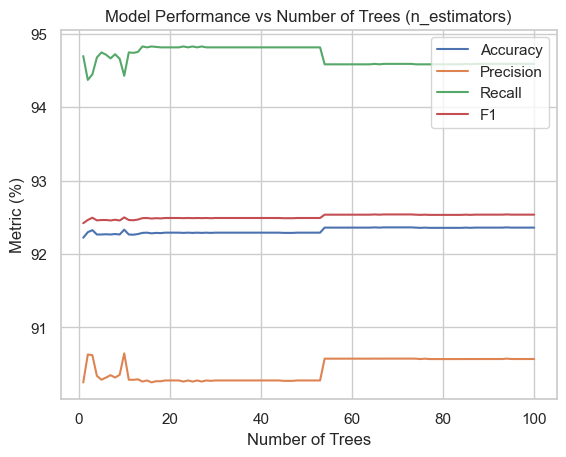

Best n_estimators (Accuracy): 65
Best Accuracy: 0.923625
Best n_estimators (Precision): 10
Best Precision: 0.9064765442454017
Best n_estimators (Recall): 14
Best Recall: 0.9482618735567622
Best n_estimators (F1): 65
Best F1: 0.9253877152277445


In [53]:
best_score, best_combo = results[0]
X_best = df[list(best_combo)]
y = df["label"]
X_train, X_test, y_train, y_test = train_test_split(X_best, y, test_size=0.2, random_state=60)

lr = LogisticRegression(max_iter=1000, random_state=60)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
print(f"Logistic Regression's Accuracy:  {accuracy_score(y_test, y_pred)}")
print(f"Logistic Regression's Precision: {precision_score(y_test, y_pred)}")
print(f"Logistic Regression's Recall:    {recall_score(y_test, y_pred)}")
print(f"Logistic Regression's F1 Score:  {f1_score(y_test, y_pred)}")

scores = {}
num_test_estimators = range(1, 101)
for n in num_test_estimators:
  print("Training:", n)
  clf = RandomForestClassifier(n_estimators=n, random_state=60, n_jobs=-1)
  clf.fit(X_train, y_train)
  y_pred = clf.predict(X_test)
  scores[n] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1": f1_score(y_test, y_pred)
    }
accuracies = [scores[n]["accuracy"] * 100 for n in num_test_estimators]
precisions = [scores[n]["precision"] * 100 for n in num_test_estimators]
recalls = [scores[n]["recall"] * 100 for n in num_test_estimators]
f1s = [scores[n]["f1"] * 100 for n in num_test_estimators]
plt.plot(num_test_estimators, accuracies, label="Accuracy")
plt.plot(num_test_estimators, precisions, label="Precision")
plt.plot(num_test_estimators, recalls, label="Recall")
plt.plot(num_test_estimators, f1s, label="F1")
plt.xlabel("Number of Trees")
plt.ylabel("Metric (%)")
plt.title("Model Performance vs Number of Trees (n_estimators)")
plt.legend()
plt.grid(True)
plt.show()

best_n_acc = max(scores, key=lambda n: scores[n]["accuracy"])
best_score_acc = scores[best_n_acc]["accuracy"]
print("Best n_estimators (Accuracy):", best_n_acc)
print("Best Accuracy:", best_score_acc)

best_n_prec = max(scores, key=lambda n: scores[n]["precision"])
best_score_prec = scores[best_n_prec]["precision"]
print("Best n_estimators (Precision):", best_n_prec)
print("Best Precision:", best_score_prec)

best_n_recall = max(scores, key=lambda n: scores[n]["recall"])
best_score_recall = scores[best_n_recall]["recall"]
print("Best n_estimators (Recall):", best_n_recall)
print("Best Recall:", best_score_recall)

best_n_f1 = max(scores, key=lambda n: scores[n]["f1"])
best_score_f1 = scores[best_n_f1]["f1"]
print("Best n_estimators (F1):", best_n_f1)
print("Best F1:", best_score_f1)

Feature Importance:
length              0.441193
max_consec_cons     0.350145
hyphen_count        0.144118
digit_ratio         0.042051
max_consec_digit    0.022478
puny_code           0.000016
dtype: float64


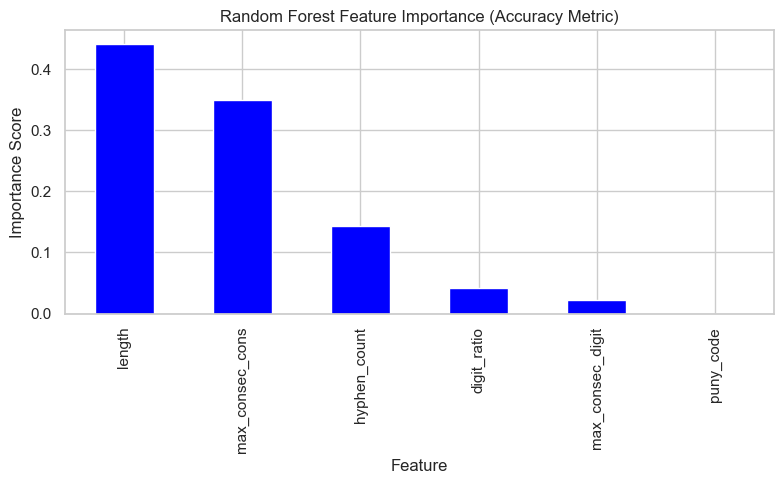

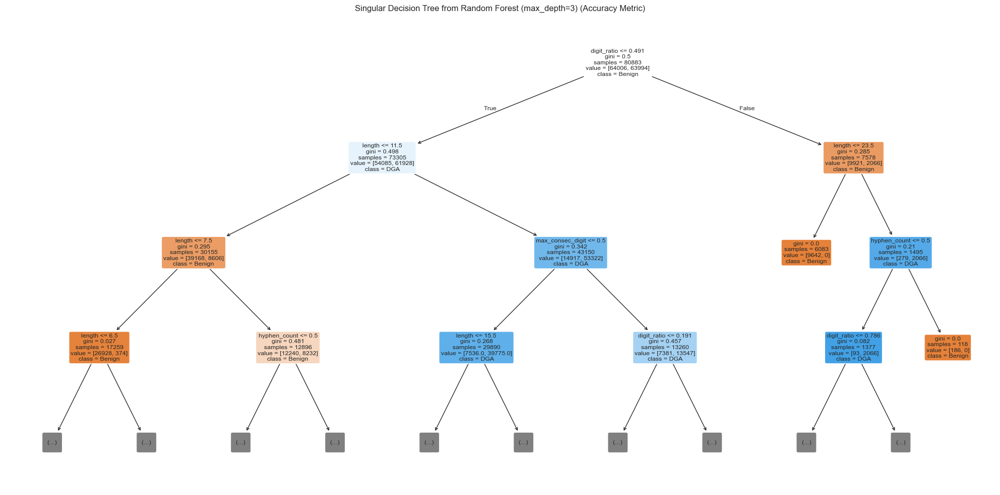

Feature Importance:
max_consec_cons     0.446825
length              0.356315
hyphen_count        0.132855
digit_ratio         0.049863
max_consec_digit    0.014125
puny_code           0.000017
dtype: float64


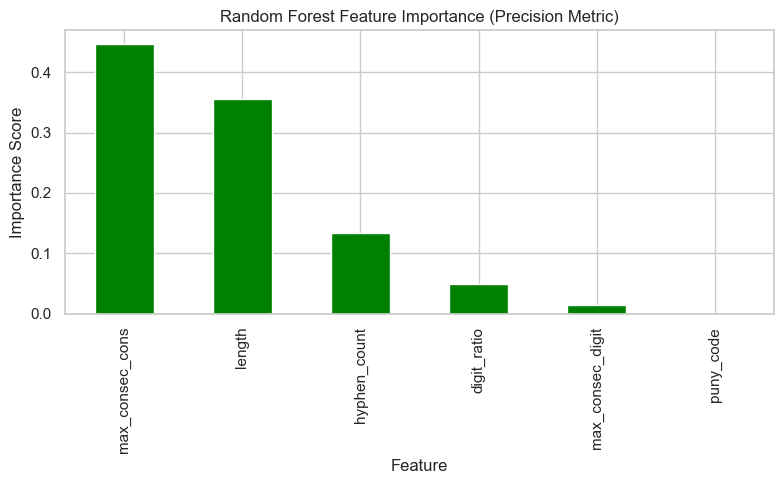

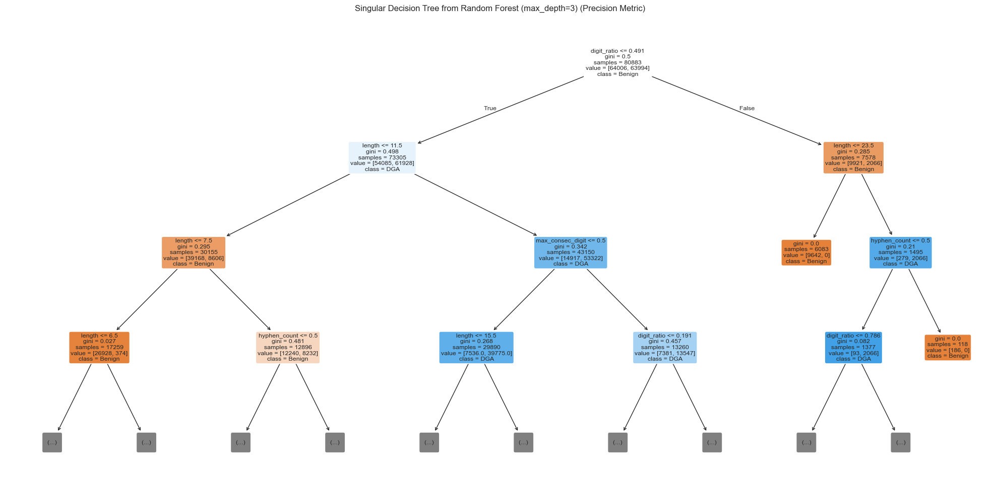

Feature Importance:
length              0.405455
max_consec_cons     0.381432
hyphen_count        0.147808
digit_ratio         0.051895
max_consec_digit    0.013396
puny_code           0.000014
dtype: float64


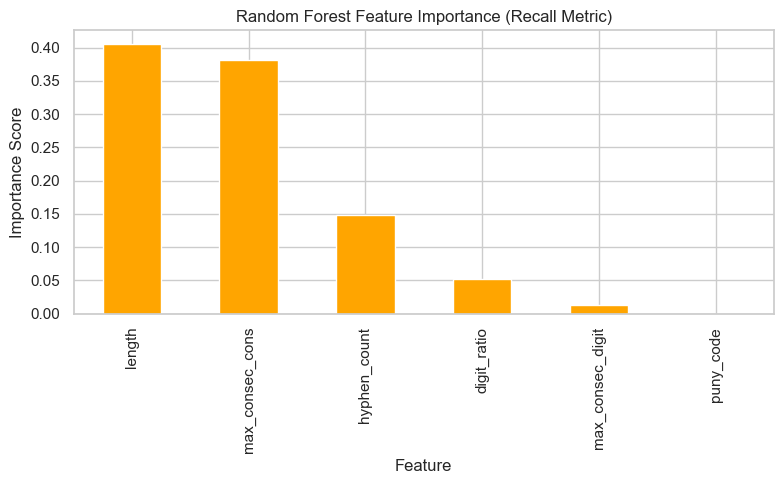

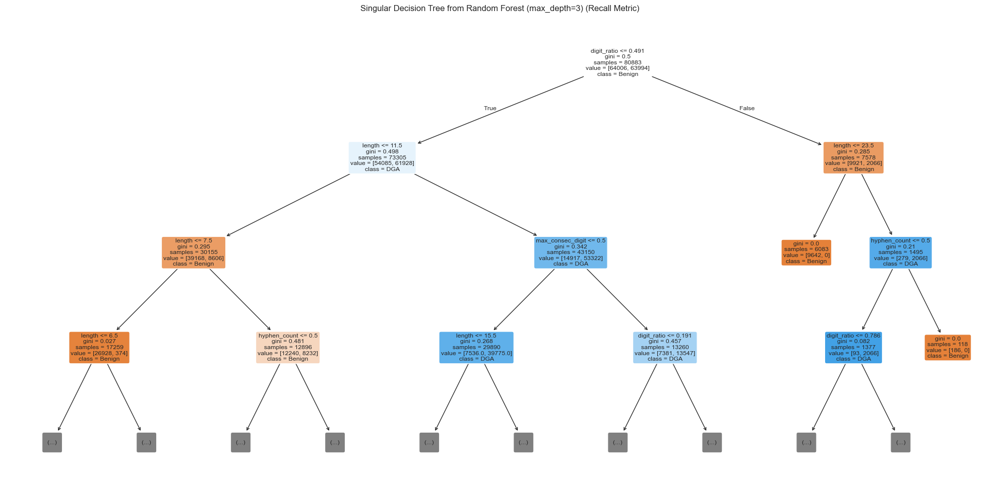

Feature Importance:
length              0.441193
max_consec_cons     0.350145
hyphen_count        0.144118
digit_ratio         0.042051
max_consec_digit    0.022478
puny_code           0.000016
dtype: float64


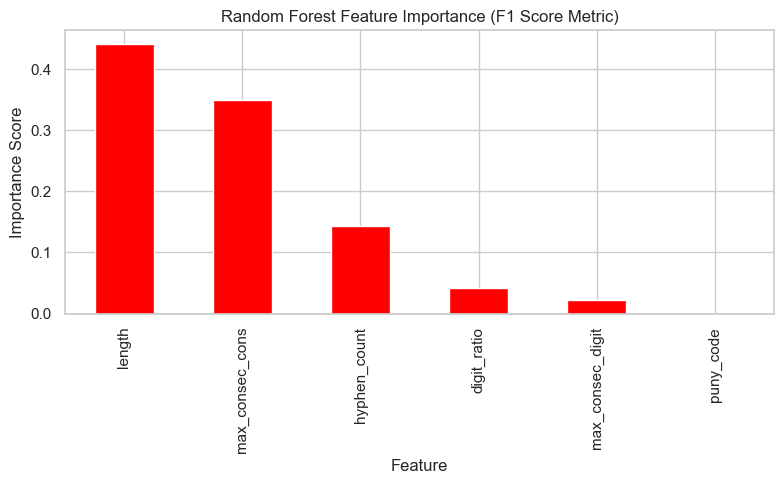

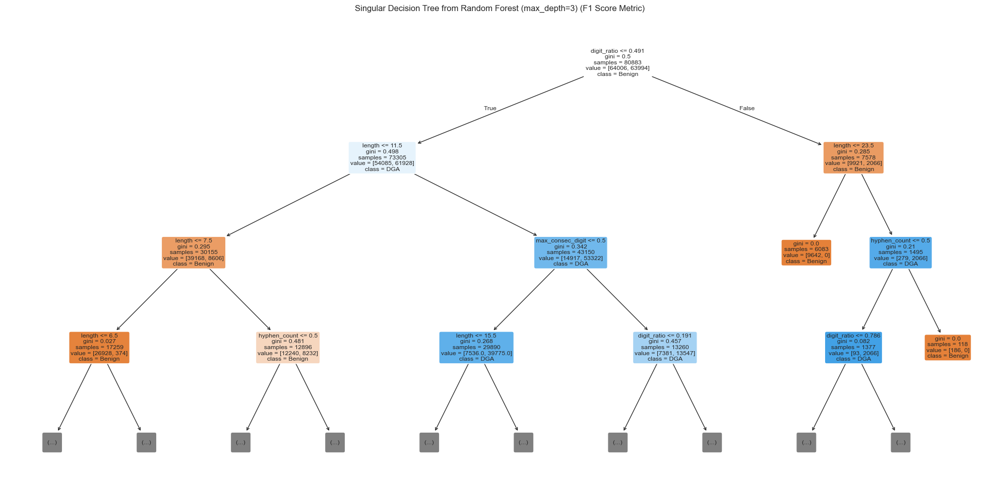

In [54]:
create_best_feature_importance(best_n_acc, "Accuracy", "blue")
create_best_feature_importance(best_n_prec, "Precision", "green")
create_best_feature_importance(best_n_recall, "Recall", "orange")
create_best_feature_importance(best_n_f1, "F1 Score", "red")

Accuracy (n=65):
	False Positive Rate: 0.09870 (9.870%)
	False Negative Rate: 0.05411 (5.411%)
	True Negatives=14400, False Positives=1577, False Negatives=867, True Positives=15156

Precision (n=10):
	False Positive Rate: 0.09770 (9.770%)
	False Negative Rate: 0.05573 (5.573%)
	True Negatives=14416, False Positives=1561, False Negatives=893, True Positives=15130

Recall (n=14):
	False Positive Rate: 0.10258 (10.258%)
	False Negative Rate: 0.05174 (5.174%)
	True Negatives=14338, False Positives=1639, False Negatives=829, True Positives=15194

F1 Score (n=65):
	False Positive Rate: 0.09870 (9.870%)
	False Negative Rate: 0.05411 (5.411%)
	True Negatives=14400, False Positives=1577, False Negatives=867, True Positives=15156



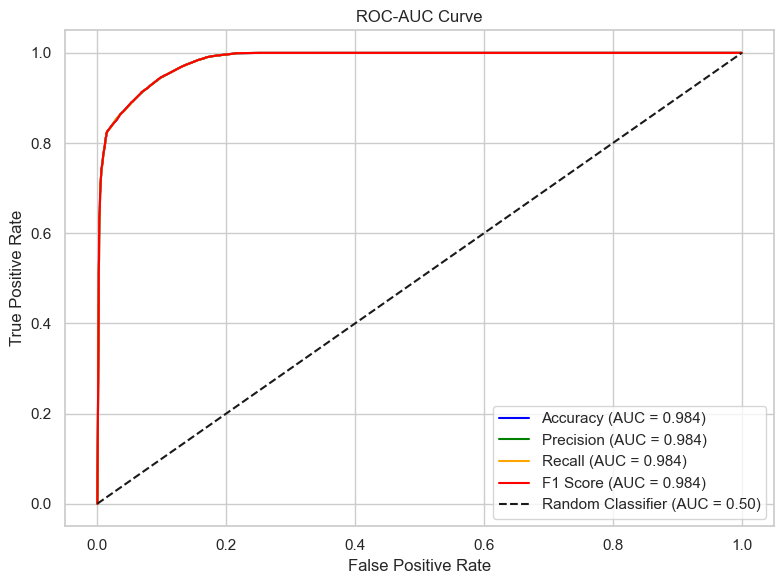

In [55]:
roc_auc_fpr(best_n_acc, best_n_prec, best_n_recall, best_n_f1, X_train, y_train, X_test, y_test)